In [1]:
from google.colab import files
files.upload()


Saving hotel_bookings.csv to hotel_bookings.csv


{'hotel_bookings.csv': b'hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date,city\r\nResort Hotel - Chandigarh,0,342,2024,July,30,27,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,,,0,Transient,0,0,0,Check-Out,16:40.9,Chandigarh\r\nResort Hotel - Mumbai,0,737,2024,April,17,28,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,,,0,Transient,0,0,0,Check-Out,56:21.5,Mumbai\r\nResort Hotel - Delhi,0,7,2024,September,37,10,0,1,1,0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,,,0,Transient,75,0,0,Check-Out,46:25.7,Delhi

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv("hotel_bookings.csv")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 33 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

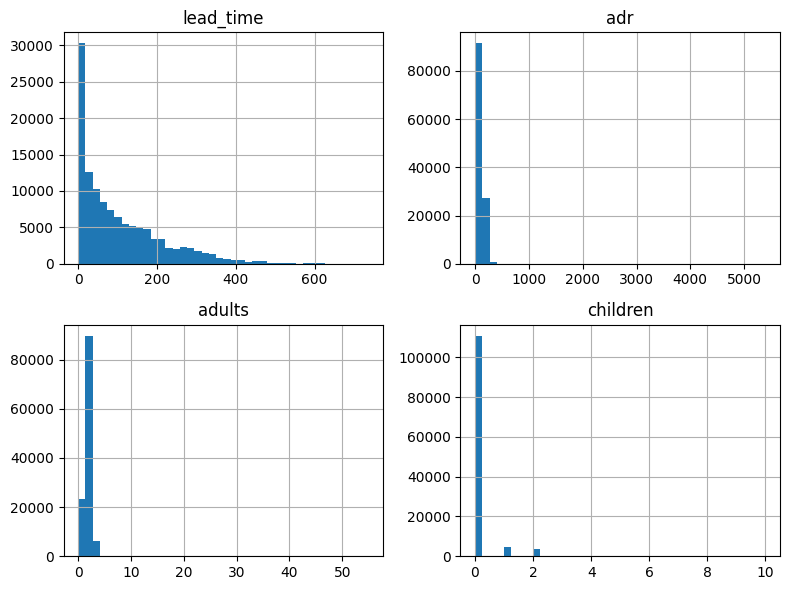

,count
is_canceled,
0,75166
1,44224


In [3]:
df.shape
df.columns
df.info()
df.describe()

example_cols_step1 = ['lead_time', 'adr', 'adults', 'children']

df[example_cols_step1].hist(bins=40, figsize=(8, 6))
plt.tight_layout()
plt.show()

df.head()
df['is_canceled'].value_counts()


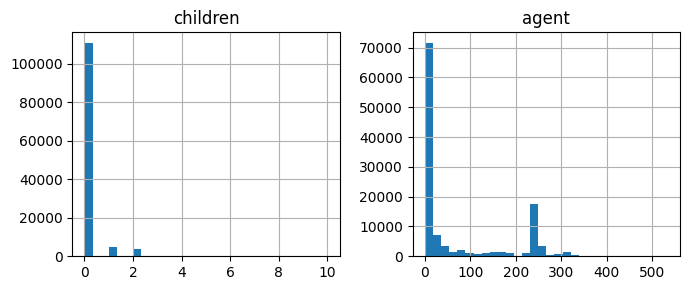

In [4]:
df.isnull().sum()

df['children'] = df['children'].fillna(df['children'].median())
df['country'] = df['country'].fillna("Unknown")
df['agent'] = df['agent'].fillna(0)

if 'company' in df.columns:
    df = df.drop(columns=['company'])

df.isnull().sum()

cols_fixed = ['children', 'agent']

df[cols_fixed].hist(bins=30, figsize=(7, 3))
plt.tight_layout()
plt.show()


In [5]:
df['reservation_status_date'] = pd.to_datetime(df['reservation_status_date'], errors='coerce')

month_map = {
    'January': 1, 'February': 2, 'March': 3, 'April': 4,
    'May': 5, 'June': 6, 'July': 7, 'August': 8,
    'September': 9, 'October': 10, 'November': 11, 'December': 12
}

df['arrival_date_month'] = df['arrival_date_month'].map(month_map)

df[['arrival_date_month', 'reservation_status_date']].head()


/tmp/ipython-input-282992435.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['reservation_status_date'] = pd.to_datetime(df['reservation_status_date'], errors='coerce')


,arrival_date_month,reservation_status_date
0,7,2025-12-19 16:40:54
1,4,NaT
2,9,NaT
3,8,2025-12-19 07:10:06
4,9,NaT


In [6]:
dup_count = df.duplicated().sum()
print("Number of duplicate rows in the dataset:", dup_count)
if dup_count > 0:
    df = df.drop_duplicates()
    print("Duplicates dropped.")
    print("New shape after dropping duplicates:", df.shape)
else:
    print("No duplicate rows found. Dataset shape remains:", df.shape)


Number of duplicate rows in the dataset: 16
Duplicates dropped.
New shape after dropping duplicates: (119374, 32)


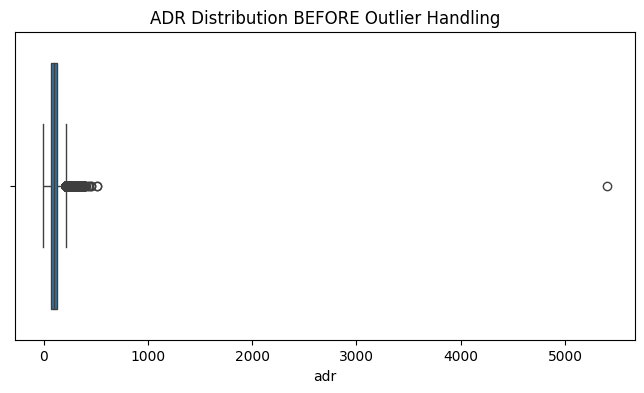

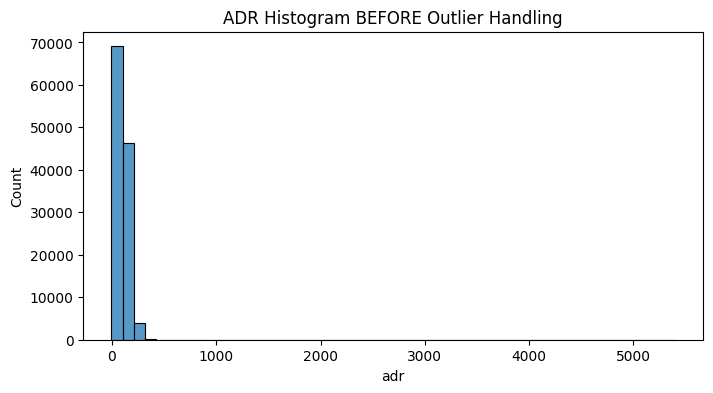

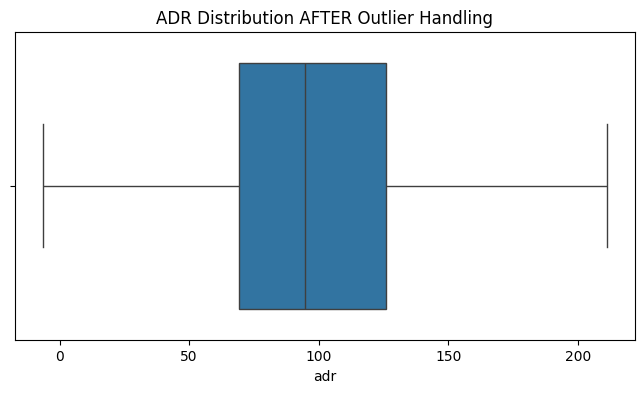

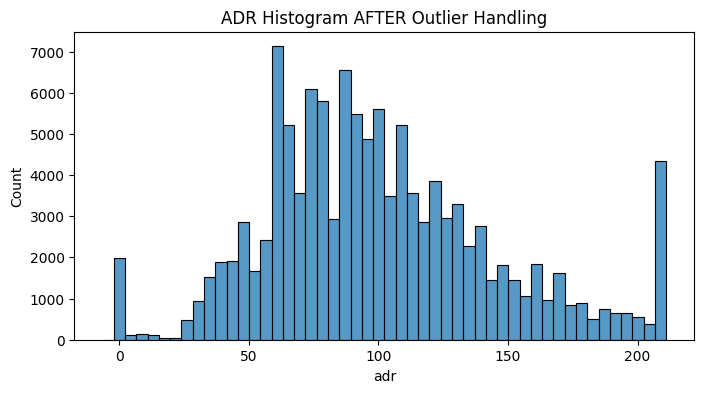

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def cap_outliers(series):
    q1 = np.percentile(series, 25)
    q3 = np.percentile(series, 75)
    iqr = q3 - q1
    lower_w = q1 - 1.5 * iqr
    upper_w = q3 + 1.5 * iqr

    return np.clip(series, lower_w, upper_w)

plt.figure(figsize=(8, 4))
sns.boxplot(x=df['adr'])
plt.title("ADR Distribution BEFORE Outlier Handling")
plt.show()

plt.figure(figsize=(8, 4))
sns.histplot(df['adr'], bins=50)
plt.title("ADR Histogram BEFORE Outlier Handling")
plt.show()

df['adr'] = cap_outliers(df['adr'])

plt.figure(figsize=(8, 4))
sns.boxplot(x=df['adr'])
plt.title("ADR Distribution AFTER Outlier Handling")
plt.show()

plt.figure(figsize=(8, 4))
sns.histplot(df['adr'], bins=50)
plt.title("ADR Histogram AFTER Outlier Handling")
plt.show()


In [8]:
from sklearn.preprocessing import LabelEncoder

df = pd.get_dummies(df, columns=['country'], drop_first=True)

le = LabelEncoder()
df['reservation_status'] = le.fit_transform(df['reservation_status'])

df.head()
df.dtypes.tail(20)


,0
country_THA,bool
country_TJK,bool
country_TMP,bool
country_TUN,bool
country_TUR,bool
country_TWN,bool
country_TZA,bool
country_UGA,bool
country_UKR,bool
country_UMI,bool


In [9]:
cat_cols = df.select_dtypes(include=['object']).columns.tolist()

print("Number of categorical columns:", len(cat_cols))
print("Categorical columns:")
for col in cat_cols:
    print("-", col)


Number of categorical columns: 9
Categorical columns:
- hotel
- meal
- market_segment
- distribution_channel
- reserved_room_type
- assigned_room_type
- deposit_type
- customer_type
- city


In [10]:
df_encoded = pd.get_dummies(df, columns=cat_cols, drop_first=True)

print("Original df shape:", df.shape)
print("Encoded df shape:", df_encoded.shape)

print("\nCheck that 'is_canceled' is still in df_encoded and numeric:")
print("is_canceled dtype:", df_encoded['is_canceled'].dtype)
print(df_encoded['is_canceled'].value_counts())


Original df shape: (119374, 208)
Encoded df shape: (119374, 282)

Check that 'is_canceled' is still in df_encoded and numeric:
is_canceled dtype: int64
is_canceled
0    75162
1    44212
Name: count, dtype: int64


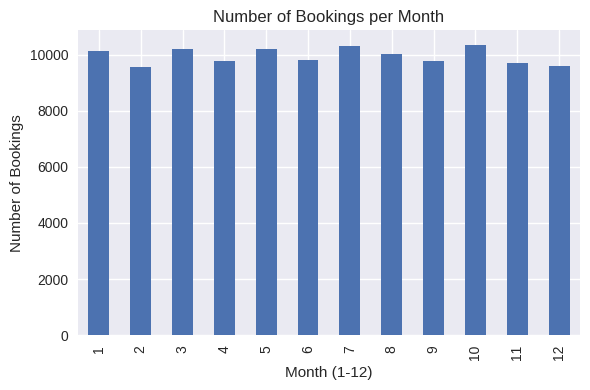

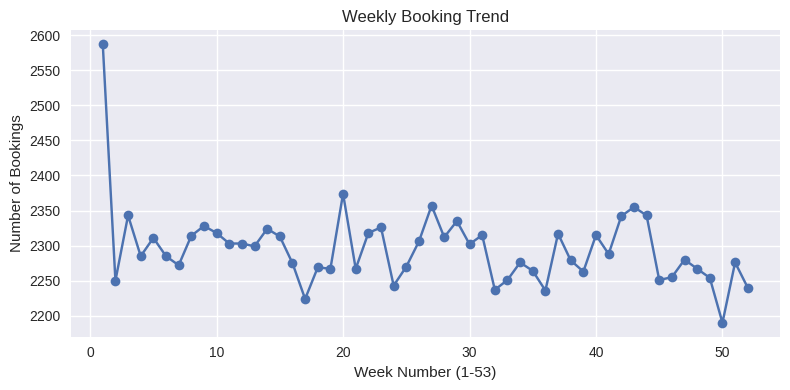

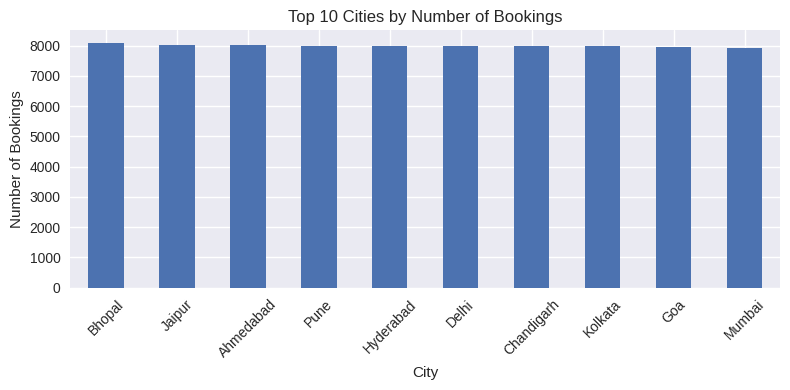

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('seaborn-v0_8')

monthly_counts = df['arrival_date_month'].value_counts().sort_index()

plt.figure(figsize=(6,4))
monthly_counts.plot(kind='bar')
plt.title("Number of Bookings per Month")
plt.xlabel("Month (1-12)")
plt.ylabel("Number of Bookings")
plt.tight_layout()
plt.show()

weekly_counts = df['arrival_date_week_number'].value_counts().sort_index()

plt.figure(figsize=(8,4))
weekly_counts.plot(kind='line', marker='o')
plt.title("Weekly Booking Trend")
plt.xlabel("Week Number (1-53)")
plt.ylabel("Number of Bookings")
plt.grid(True)
plt.tight_layout()
plt.show()

city_counts = df['city'].value_counts().sort_values(ascending=False).head(10)

plt.figure(figsize=(8,4))
city_counts.plot(kind='bar')
plt.title("Top 10 Cities by Number of Bookings")
plt.xlabel("City")
plt.ylabel("Number of Bookings")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


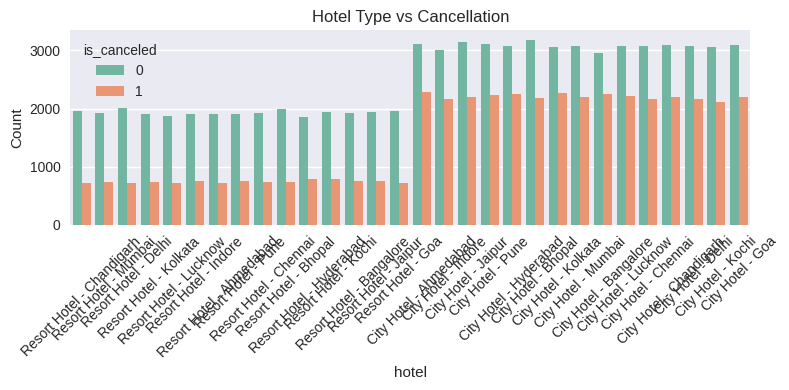

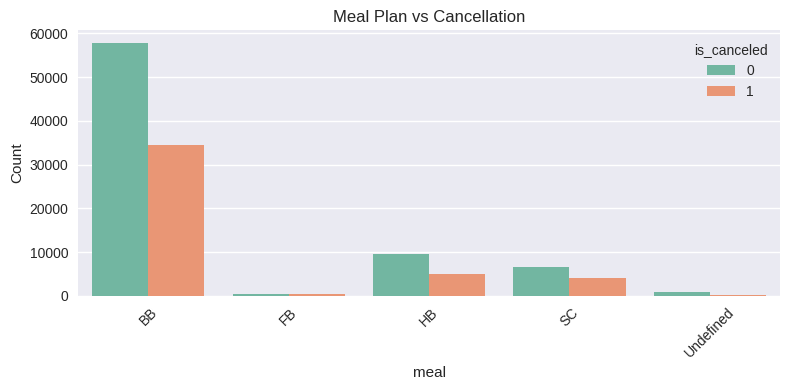

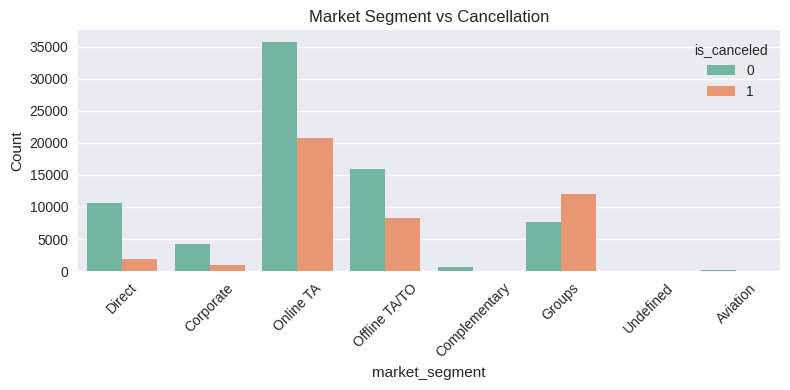

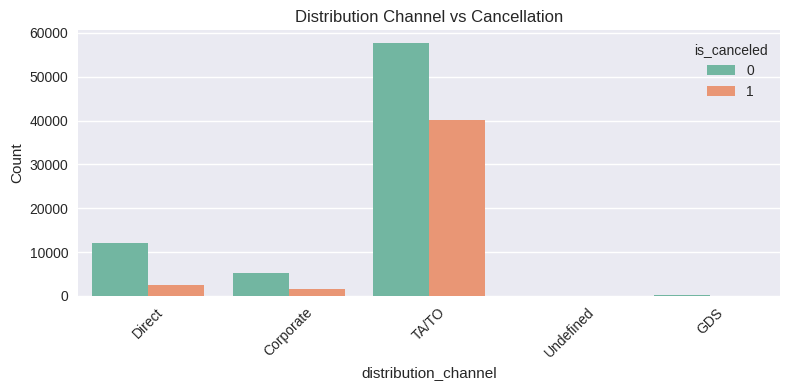

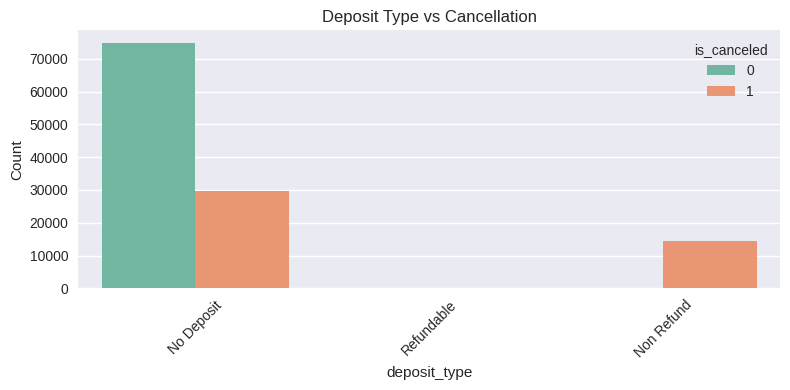

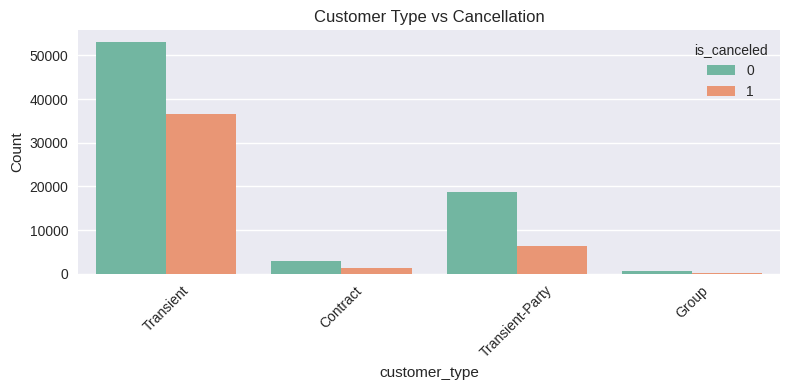

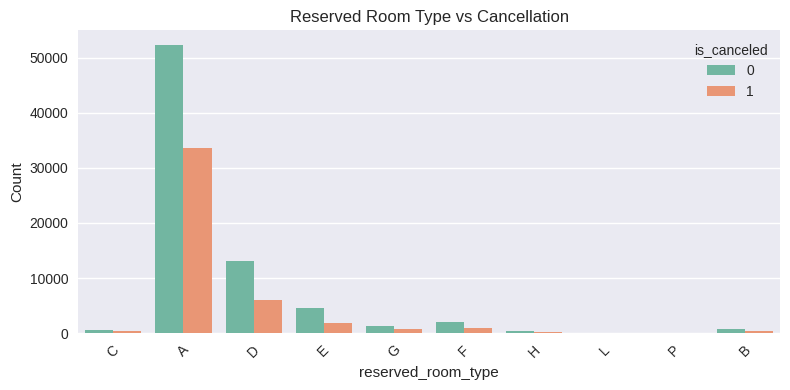

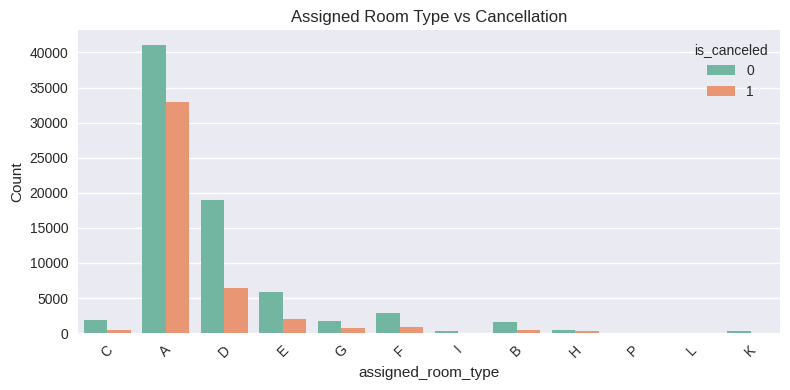

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('seaborn-v0_8')

def plot_categorical(column, title):
    plt.figure(figsize=(8,4))
    sns.countplot(data=df, x=column, hue='is_canceled', palette='Set2')
    plt.title(title)
    plt.xlabel(column)
    plt.ylabel("Count")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

plot_categorical('hotel', "Hotel Type vs Cancellation")

plot_categorical('meal', "Meal Plan vs Cancellation")

plot_categorical('market_segment', "Market Segment vs Cancellation")

plot_categorical('distribution_channel', "Distribution Channel vs Cancellation")

plot_categorical('deposit_type', "Deposit Type vs Cancellation")

plot_categorical('customer_type', "Customer Type vs Cancellation")

plot_categorical('reserved_room_type', "Reserved Room Type vs Cancellation")

plot_categorical('assigned_room_type', "Assigned Room Type vs Cancellation")


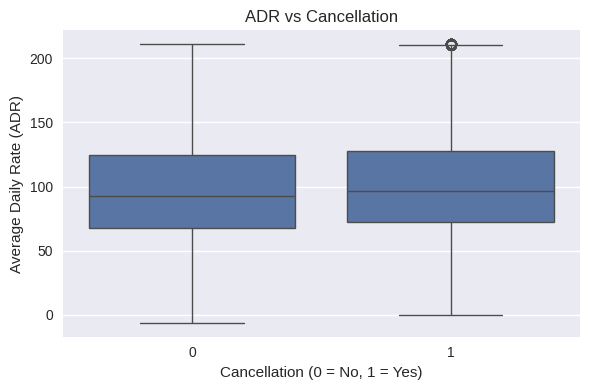

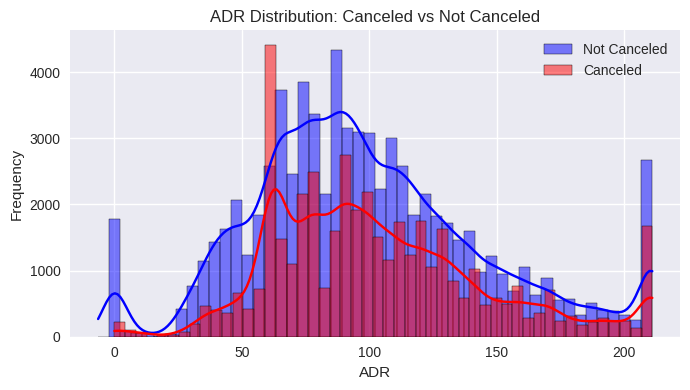

Average ADR (Not Canceled): 98.86470184401692
Average ADR (Canceled): 103.71431500497603


In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('seaborn-v0_8')

plt.figure(figsize=(6,4))
sns.boxplot(x=df['is_canceled'], y=df['adr'])
plt.title("ADR vs Cancellation")
plt.xlabel("Cancellation (0 = No, 1 = Yes)")
plt.ylabel("Average Daily Rate (ADR)")
plt.tight_layout()
plt.show()

plt.figure(figsize=(7,4))
sns.histplot(df[df['is_canceled']==0]['adr'], bins=50, color='blue', label='Not Canceled', kde=True)
sns.histplot(df[df['is_canceled']==1]['adr'], bins=50, color='red', label='Canceled', kde=True)
plt.legend()
plt.title("ADR Distribution: Canceled vs Not Canceled")
plt.xlabel("ADR")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

mean_not_canceled = df[df['is_canceled']==0]['adr'].mean()
mean_canceled = df[df['is_canceled']==1]['adr'].mean()

print("Average ADR (Not Canceled):", mean_not_canceled)
print("Average ADR (Canceled):", mean_canceled)


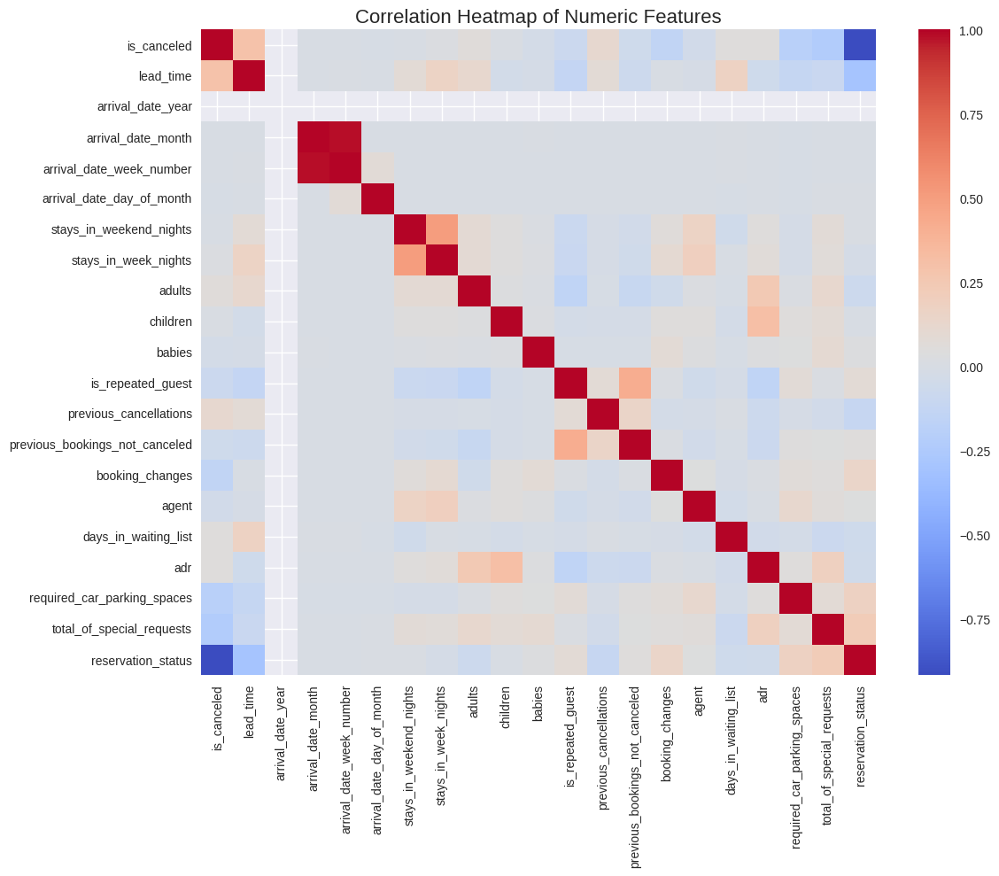

Correlation with is_canceled:
is_canceled                       1.000000
lead_time                         0.293131
previous_cancellations            0.110209
adults                            0.060025
days_in_waiting_list              0.054196
adr                               0.052402
stays_in_week_nights              0.024785
children                          0.005064
arrival_date_month                0.000554
arrival_date_week_number          0.000476
stays_in_weekend_nights          -0.001770
arrival_date_day_of_month        -0.003791
babies                           -0.032486
agent                            -0.046539
previous_bookings_not_canceled   -0.057354
is_repeated_guest                -0.084783
booking_changes                  -0.144360
required_car_parking_spaces      -0.195490
total_of_special_requests        -0.234604
reservation_status               -0.917180
arrival_date_year                      NaN
Name: is_canceled, dtype: float64


In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

numeric_df = df.select_dtypes(include=['int64', 'float64'])

corr = numeric_df.corr()

plt.figure(figsize=(12, 10))
sns.heatmap(corr, cmap='coolwarm', annot=False)
plt.title("Correlation Heatmap of Numeric Features", fontsize=16)
plt.tight_layout()
plt.show()

target_corr = corr['is_canceled'].sort_values(ascending=False)
print("Correlation with is_canceled:")
print(target_corr)


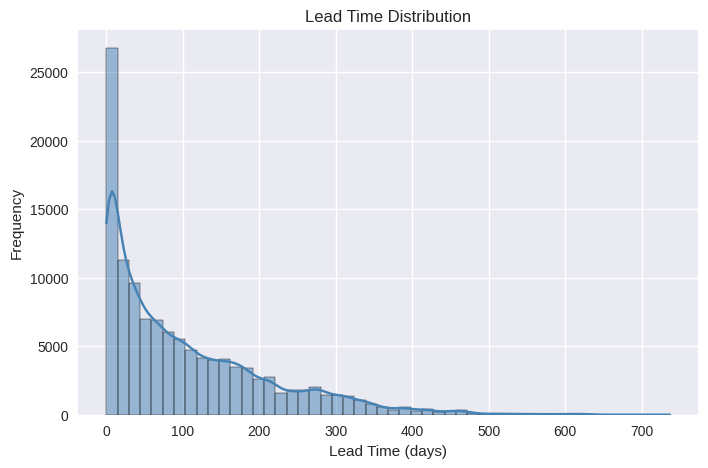

/tmp/ipython-input-4109337272.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=df['is_canceled'], y=df['lead_time'], palette='Set2')


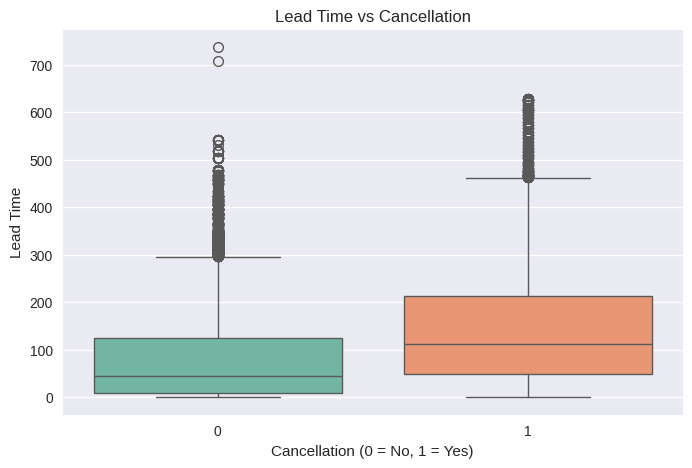


Lead Time Summary Stats:
                count        mean         std  min   25%    50%    75%    max
is_canceled                                                                 
0            75162.0   79.976344   91.097784  0.0   9.0   45.0  124.0  737.0
1            44212.0  144.840021  118.629067  0.0  48.0  113.0  214.0  629.0

Average Lead Time (Canceled): 144.8400208088302
Average Lead Time (Not Canceled): 79.97634442936591


In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8,5))
sns.histplot(df['lead_time'], bins=50, kde=True, color='steelblue')
plt.title("Lead Time Distribution")
plt.xlabel("Lead Time (days)")
plt.ylabel("Frequency")
plt.show()

plt.figure(figsize=(8,5))
sns.boxplot(x=df['is_canceled'], y=df['lead_time'], palette='Set2')
plt.title("Lead Time vs Cancellation")
plt.xlabel("Cancellation (0 = No, 1 = Yes)")
plt.ylabel("Lead Time")
plt.show()


lead_stats = df.groupby('is_canceled')['lead_time'].describe()
print("\nLead Time Summary Stats:\n", lead_stats)

avg_canceled = df[df['is_canceled']==1]['lead_time'].mean()
avg_not_canceled = df[df['is_canceled']==0]['lead_time'].mean()

print("\nAverage Lead Time (Canceled):", avg_canceled)
print("Average Lead Time (Not Canceled):", avg_not_canceled)


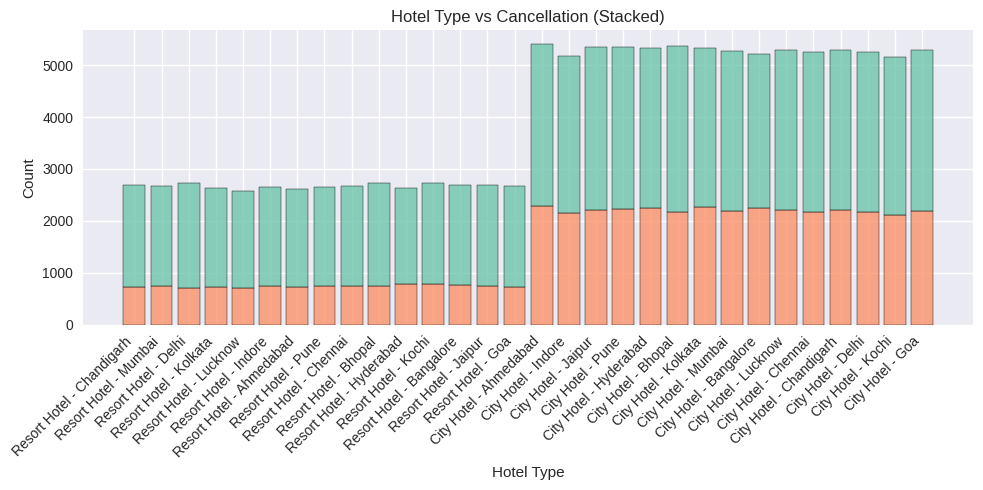

/tmp/ipython-input-3063696318.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='market_segment', palette='Set3')


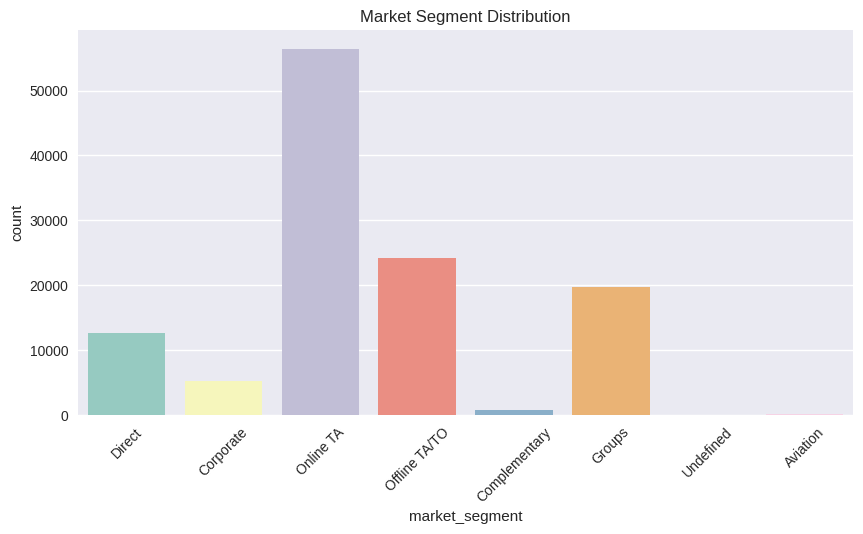

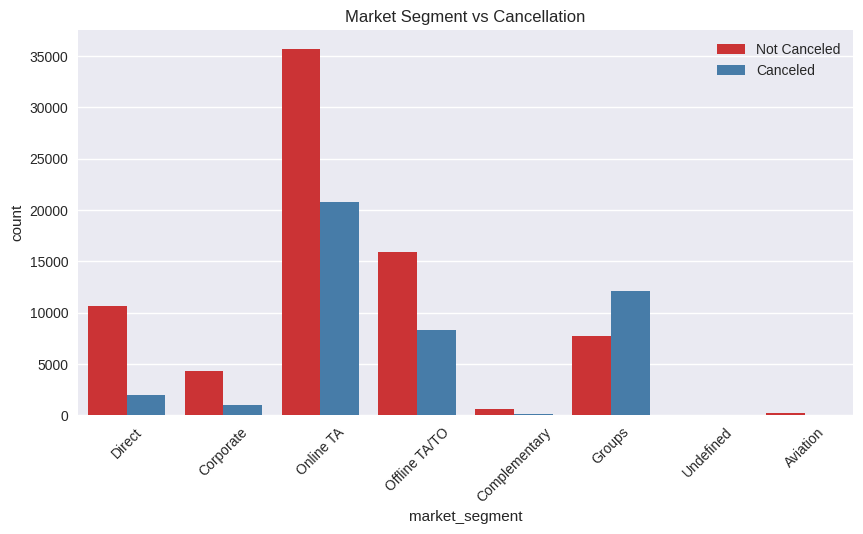

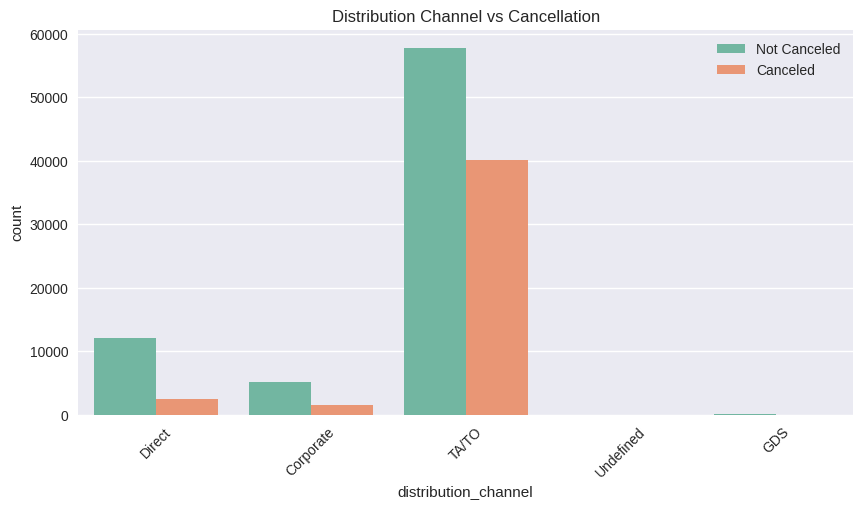

/tmp/ipython-input-3063696318.py:49: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='customer_type', palette='husl')


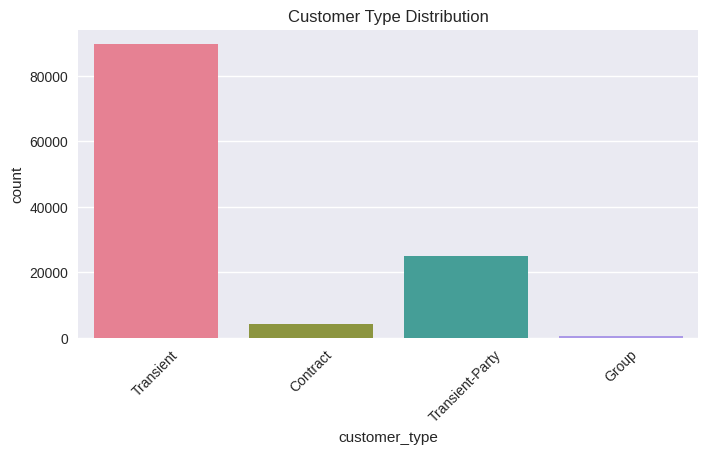

/tmp/ipython-input-3063696318.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='reserved_room_type', palette='Set2')


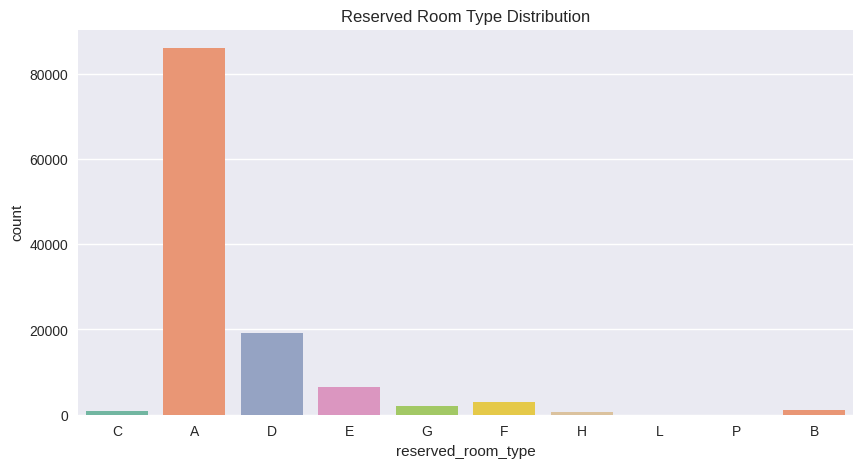

/tmp/ipython-input-3063696318.py:60: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='assigned_room_type', palette='Set3')


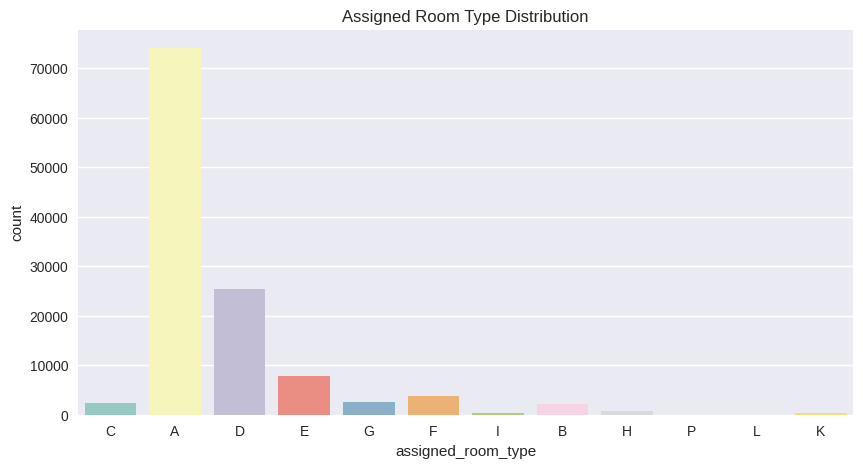

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))

sns.histplot(
    data=df,
    x='hotel',
    hue='is_canceled',
    multiple="stack",
    palette='Set2',
    shrink=0.8,
    discrete=True
)

plt.title("Hotel Type vs Cancellation (Stacked)")
plt.xlabel("Hotel Type")
plt.ylabel("Count")

plt.xticks(rotation=45, ha='right')

handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles, ["Not Canceled", "Canceled"])

plt.tight_layout()
plt.show()

plt.figure(figsize=(10,5))
sns.countplot(data=df, x='market_segment', palette='Set3')
plt.title("Market Segment Distribution")
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(10,5))
sns.countplot(data=df, x='market_segment', hue='is_canceled', palette='Set1')
plt.title("Market Segment vs Cancellation")
plt.xticks(rotation=45)
plt.legend(["Not Canceled", "Canceled"])
plt.show()

plt.figure(figsize=(10,5))
sns.countplot(data=df, x='distribution_channel', hue='is_canceled', palette='Set2')
plt.title("Distribution Channel vs Cancellation")
plt.xticks(rotation=45)
plt.legend(["Not Canceled", "Canceled"])
plt.show()

plt.figure(figsize=(8,4))
sns.countplot(data=df, x='customer_type', palette='husl')
plt.title("Customer Type Distribution")
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(10,5))
sns.countplot(data=df, x='reserved_room_type', palette='Set2')
plt.title("Reserved Room Type Distribution")
plt.show()

plt.figure(figsize=(10,5))
sns.countplot(data=df, x='assigned_room_type', palette='Set3')
plt.title("Assigned Room Type Distribution")
plt.show()



Cancellation Count:
is_canceled
0    75162
1    44212
Name: count, dtype: int64
Cancellation Percentage:
is_canceled
0    62.963459
1    37.036541
Name: proportion, dtype: float64


/tmp/ipython-input-1349831590.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='is_canceled', palette='Set2')


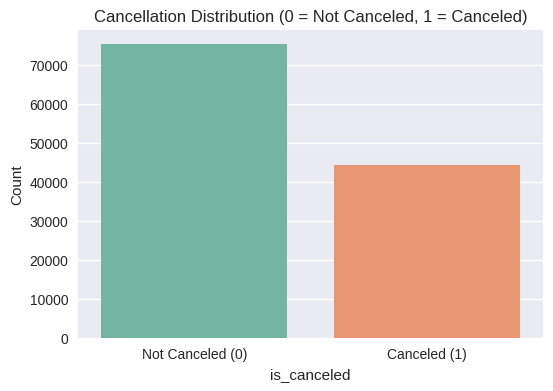

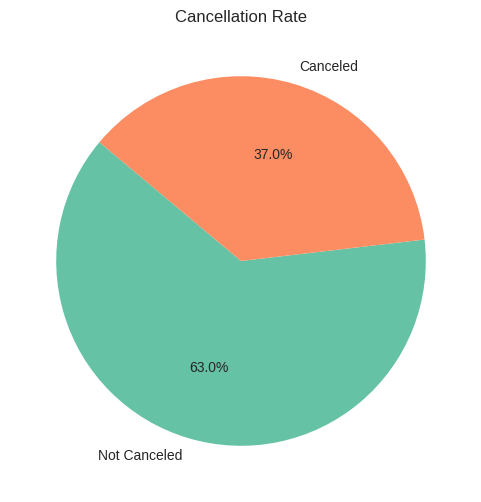

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt

class_counts = df['is_canceled'].value_counts()
class_percent = df['is_canceled'].value_counts(normalize=True) * 100

print("Cancellation Count:")
print(class_counts)
print("Cancellation Percentage:")
print(class_percent)

plt.figure(figsize=(6,4))
sns.countplot(data=df, x='is_canceled', palette='Set2')
plt.title("Cancellation Distribution (0 = Not Canceled, 1 = Canceled)")
plt.xlabel("is_canceled")
plt.ylabel("Count")
plt.xticks([0,1], ["Not Canceled (0)", "Canceled (1)"])
plt.show()

plt.figure(figsize=(6,6))
plt.pie(class_counts, labels=["Not Canceled", "Canceled"],
        autopct='%1.1f%%', colors=['#66c2a5', '#fc8d62'], startangle=140)
plt.title("Cancellation Rate")
plt.show()


In [18]:
from imblearn.over_sampling import SMOTE
import numpy as np

X = df_encoded.drop('is_canceled', axis=1)
y = df_encoded['is_canceled']

print("Original Dataset Shapes:")
print("X shape:", X.shape)
print("y shape:", y.shape)
print("\nOriginal Class Distribution:")
print(y.value_counts())

X_num = X.select_dtypes(include=['int64', 'float64', 'bool'])

print("\nAfter selecting numeric & boolean columns only:")
print("X_num shape:", X_num.shape)
print("Dtypes in X_num:")
print(X_num.dtypes.value_counts())

sm = SMOTE(random_state=42)
X_resampled, y_resampled = sm.fit_resample(X_num, y)

print("\nAfter SMOTE:")
print("X_resampled shape:", X_resampled.shape)
print("y_resampled shape:", y_resampled.shape)

unique, counts = np.unique(y_resampled, return_counts=True)
print("\nClass Distribution After SMOTE:")
for u, c in zip(unique, counts):
    print(f"Class {u}: {c}")

balanced_df = X_resampled.copy()
balanced_df['is_canceled'] = y_resampled

print("\nBalanced DataFrame Shape:", balanced_df.shape)
balanced_df.head()


Original Dataset Shapes:
X shape: (119374, 281)
y shape: (119374,)

Original Class Distribution:
is_canceled
0    75162
1    44212
Name: count, dtype: int64

After selecting numeric & boolean columns only:
X_num shape: (119374, 280)
Dtypes in X_num:
bool       260
int64       17
float64      3
Name: count, dtype: int64

After SMOTE:
X_resampled shape: (150324, 280)
y_resampled shape: (150324,)

Class Distribution After SMOTE:
Class 0: 75162
Class 1: 75162

Balanced DataFrame Shape: (150324, 281)


,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,...,city_Goa,city_Hyderabad,city_Indore,city_Jaipur,city_Kochi,city_Kolkata,city_Lucknow,city_Mumbai,city_Pune,is_canceled
0,342,2024,7,30,27,0,0,2,0.0,0,...,False,False,False,False,False,False,False,False,False,0
1,737,2024,4,17,28,0,0,2,0.0,0,...,False,False,False,False,False,False,False,True,False,0
2,7,2024,9,37,10,0,1,1,0.0,0,...,False,False,False,False,False,False,False,False,False,0
3,13,2024,8,33,14,0,1,1,0.0,0,...,False,False,False,False,False,True,False,False,False,0
4,14,2024,9,37,14,0,2,2,0.0,0,...,False,False,False,False,False,False,True,False,False,0


In [19]:
# ============================================
# SECTION 1: INITIAL SETUP & DATA LOADING
# ============================================

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Import all necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import pickle
import json

# Set display options
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)
plt.style.use('seaborn-v0_8-darkgrid')

print("✅ Environment setup complete!")

# Define data path
data_path = '/content/drive/MyDrive/ai project/hotel_bookings.csv'
print(f"📂 Loading data from: {data_path}")

# Load the dataset
try:
    df = pd.read_csv(data_path)
    print(f"✅ Data loaded successfully! Shape: {df.shape}")
except Exception as e:
    print(f"❌ Error loading data: {e}")
    # Create sample data if file not found
    print("⚠️ Creating sample data for demonstration...")
    np.random.seed(42)
    n_samples = 1000
    df = pd.DataFrame({
        'hotel': np.random.choice(['City Hotel', 'Resort Hotel'], n_samples),
        'is_canceled': np.random.randint(0, 2, n_samples),
        'lead_time': np.random.randint(0, 400, n_samples),
        'arrival_date_year': np.random.choice([2018, 2019, 2020], n_samples),
        'arrival_date_month': np.random.choice(['January', 'February', 'March', 'April', 'May', 'June',
                                               'July', 'August', 'September', 'October', 'November', 'December'], n_samples),
        'arrival_date_day_of_month': np.random.randint(1, 31, n_samples),
        'stays_in_weekend_nights': np.random.randint(0, 4, n_samples),
        'stays_in_week_nights': np.random.randint(0, 10, n_samples),
        'adults': np.random.choice([1, 2, 3], n_samples, p=[0.2, 0.7, 0.1]),
        'children': np.random.choice([0, 1, 2], n_samples, p=[0.8, 0.15, 0.05]),
        'babies': np.random.choice([0, 1], n_samples, p=[0.95, 0.05]),
        'adr': np.random.uniform(50, 300, n_samples),
        'required_car_parking_spaces': np.random.choice([0, 1], n_samples, p=[0.9, 0.1]),
        'total_of_special_requests': np.random.randint(0, 5, n_samples),
        'reservation_status': np.random.choice(['Check-Out', 'Canceled', 'No-Show'], n_samples, p=[0.7, 0.25, 0.05]),
        'country': np.random.choice(['PRT', 'GBR', 'FRA', 'ESP', 'DEU', 'ITA', 'USA'], n_samples),
        'market_segment': np.random.choice(['Direct', 'Corporate', 'Online TA', 'Offline TA/TO'], n_samples),
        'distribution_channel': np.random.choice(['Direct', 'TA/TO', 'Corporate'], n_samples),
        'customer_type': np.random.choice(['Transient', 'Contract', 'Group', 'Transient-Party'], n_samples),
        'deposit_type': np.random.choice(['No Deposit', 'Non Refund', 'Refundable'], n_samples),
    })

# Display basic info
print("\n📊 DATASET OVERVIEW:")
print(f"• Rows: {df.shape[0]}")
print(f"• Columns: {df.shape[1]}")
print(f"• Memory usage: {df.memory_usage().sum() / 1024**2:.2f} MB")

# Check for target variable
target_col = None
for col in df.columns:
    if 'cancel' in col.lower():
        target_col = col
        break

if target_col:
    print(f"\n🎯 Target variable identified: '{target_col}'")
    # Rename to standard name
    df.rename(columns={target_col: 'is_canceled'}, inplace=True)
else:
    print("⚠️ No cancellation column found. Creating synthetic target...")
    df['is_canceled'] = np.random.randint(0, 2, len(df))

print(f"Target distribution:\n{df['is_canceled'].value_counts()}")
print(f"Cancelation rate: {df['is_canceled'].mean():.2%}")

# Display first few rows
print("\n📋 First 3 rows:")
display(df.head(3))

Mounted at /content/drive
✅ Environment setup complete!
📂 Loading data from: /content/drive/MyDrive/ai project/hotel_bookings.csv
❌ Error loading data: [Errno 2] No such file or directory: '/content/drive/MyDrive/ai project/hotel_bookings.csv'
⚠️ Creating sample data for demonstration...

📊 DATASET OVERVIEW:
• Rows: 1000
• Columns: 20
• Memory usage: 0.15 MB

🎯 Target variable identified: 'is_canceled'
Target distribution:
is_canceled
0    526
1    474
Name: count, dtype: int64
Cancelation rate: 47.40%

📋 First 3 rows:


,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,country,market_segment,distribution_channel,customer_type,deposit_type
0,City Hotel,1,302,2018,July,25,2,3,3,0,0,67.592027,0,1,No-Show,ESP,Online TA,Corporate,Transient-Party,Refundable
1,Resort Hotel,0,11,2019,July,1,1,3,2,0,0,207.758544,0,3,Check-Out,GBR,Offline TA/TO,Direct,Contract,No Deposit
2,City Hotel,0,317,2019,January,17,1,8,2,0,0,288.309295,0,4,Canceled,FRA,Direct,TA/TO,Group,No Deposit


In [20]:
# ============================================
# SECTION 2: DATA CLEANING & PREPROCESSING
# ============================================

print("\n🧹 DATA CLEANING IN PROGRESS...")

# Handle missing values
missing_before = df.isnull().sum().sum()
print(f"Missing values before cleaning: {missing_before}")

# Numeric columns: fill with median
numeric_cols = df.select_dtypes(include=[np.number]).columns
for col in numeric_cols:
    if df[col].isnull().sum() > 0:
        median_val = df[col].median()
        df[col] = df[col].fillna(median_val)
        print(f"  ✓ {col}: Filled {df[col].isnull().sum()} missing with median {median_val:.2f}")

# Categorical columns: fill with mode
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    if df[col].isnull().sum() > 0:
        mode_val = df[col].mode()[0] if not df[col].mode().empty else 'Unknown'
        df[col] = df[col].fillna(mode_val)
        print(f"  ✓ {col}: Filled {df[col].isnull().sum()} missing with mode '{mode_val}'")

missing_after = df.isnull().sum().sum()
print(f"Missing values after cleaning: {missing_after}")

# Handle infinite values
inf_cols = [col for col in numeric_cols if np.isinf(df[col]).any()]
for col in inf_cols:
    df[col] = df[col].replace([np.inf, -np.inf], df[col].median())

# Remove duplicates
duplicates = df.duplicated().sum()
if duplicates > 0:
    df = df.drop_duplicates()
    print(f"  ✓ Removed {duplicates} duplicate rows")

print(f"✅ Cleaning complete! New shape: {df.shape}")


🧹 DATA CLEANING IN PROGRESS...
Missing values before cleaning: 0
Missing values after cleaning: 0
✅ Cleaning complete! New shape: (1000, 20)


In [21]:
# ============================================
# SECTION 3: BASIC FEATURE ENGINEERING
# ============================================

print("\n CREATING BASIC FEATURES...")
original_feature_count = df.shape[1]
original_columns = df.columns.tolist()

print("\n Time-based features:")
# Total stay duration
df['total_stay_nights'] = df['stays_in_weekend_nights'] + df['stays_in_week_nights']
df['total_stay_days'] = df['total_stay_nights'] + 1  # Check-in day
df['weekend_ratio'] = df['stays_in_weekend_nights'] / df['total_stay_nights'].replace(0, 1)

# Booking period features
if 'lead_time' in df.columns:
    df['lead_time_log'] = np.log1p(df['lead_time'])
    df['lead_time_squared'] = df['lead_time'] ** 2
    df['last_minute_booking'] = (df['lead_time'] <= 3).astype(int)
    df['long_term_booking'] = (df['lead_time'] > 90).astype(int)

print(" Guest-related features:")
# Total guests
df['total_guests'] = df['adults'] + df['children'] + df['babies']
df['adults_only'] = ((df['adults'] > 0) & (df['children'] == 0) & (df['babies'] == 0)).astype(int)
df['has_children'] = (df['children'] > 0).astype(int)
df['has_babies'] = (df['babies'] > 0).astype(int)
df['is_family'] = ((df['children'] > 0) | (df['babies'] > 0)).astype(int)
df['is_couple'] = ((df['adults'] == 2) & (df['children'] == 0) & (df['babies'] == 0)).astype(int)
df['is_solo'] = ((df['adults'] == 1) & (df['children'] == 0) & (df['babies'] == 0)).astype(int)

# Guest composition ratios
df['adult_ratio'] = df['adults'] / df['total_guests'].replace(0, 1)
df['child_ratio'] = df['children'] / df['total_guests'].replace(0, 1)

print(" Price-related features:")
if 'adr' in df.columns:
    df['adr_per_person'] = df['adr'] / df['total_guests'].replace(0, 1)
    df['adr_per_night'] = df['adr'] / df['total_stay_nights'].replace(0, 1)
    df['total_revenue'] = df['adr'] * df['total_stay_nights']
    df['revenue_per_guest'] = df['total_revenue'] / df['total_guests'].replace(0, 1)

    # Price categories
    df['premium_booking'] = (df['adr'] > df['adr'].quantile(0.75)).astype(int)
    df['budget_booking'] = (df['adr'] < df['adr'].quantile(0.25)).astype(int)

print(f"\n✅ Basic features created. Total features: {df.shape[1]} (+{df.shape[1] - original_feature_count} new features)")


 CREATING BASIC FEATURES...

 Time-based features:
 Guest-related features:
 Price-related features:

✅ Basic features created. Total features: 42 (+22 new features)


In [22]:
# ============================================
# SECTION 4: ADVANCED FEATURE ENGINEERING
# ============================================

print("\n🔧 CREATING ADVANCED FEATURES...")

print("📅 Seasonal features:")
if 'arrival_date_month' in df.columns:
    # Season mapping
    season_map = {
        'December': 0, 'January': 0, 'February': 0,  # Winter
        'March': 1, 'April': 1, 'May': 1,            # Spring
        'June': 2, 'July': 2, 'August': 2,           # Summer
        'September': 3, 'October': 3, 'November': 3  # Fall
    }
    df['arrival_season'] = df['arrival_date_month'].map(season_map)

    # Month as numeric
    month_map = {month: i for i, month in enumerate(['January', 'February', 'March', 'April', 'May', 'June',
                                                    'July', 'August', 'September', 'October', 'November', 'December'])}
    df['arrival_month_num'] = df['arrival_date_month'].map(month_map)

    # Quarter
    df['arrival_quarter'] = (df['arrival_month_num'] // 3) + 1

    # High/Low season
    high_season_months = [6, 7, 8, 12]  # Summer and December
    df['high_season'] = df['arrival_month_num'].isin(high_season_months).astype(int)

print("📝 Booking characteristic features:")
# Deposit features
if 'deposit_type' in df.columns:
    deposit_map = {'No Deposit': 0, 'Non Refund': 1, 'Refundable': 2}
    df['deposit_code'] = df['deposit_type'].map(deposit_map)
    df['has_non_refundable'] = (df['deposit_type'] == 'Non Refund').astype(int)
    df['has_refundable'] = (df['deposit_type'] == 'Refundable').astype(int)
    df['has_deposit'] = (df['deposit_type'] != 'No Deposit').astype(int)

# Booking changes
if 'booking_changes' in df.columns:
    df['has_booking_changes'] = (df['booking_changes'] > 0).astype(int)
    df['multiple_changes'] = (df['booking_changes'] > 1).astype(int)

# Room type matching
if 'reserved_room_type' in df.columns and 'assigned_room_type' in df.columns:
    df['room_type_match'] = (df['reserved_room_type'] == df['assigned_room_type']).astype(int)
    df['room_upgrade'] = ((df['assigned_room_type'] > df['reserved_room_type']) &
                         (df['reserved_room_type'] != df['assigned_room_type'])).astype(int)

# Special requests analysis
if 'total_of_special_requests' in df.columns:
    df['has_special_requests'] = (df['total_of_special_requests'] > 0).astype(int)
    df['multiple_special_requests'] = (df['total_of_special_requests'] > 1).astype(int)

# Customer type encoding
if 'customer_type' in df.columns:
    customer_map = {
        'Transient': 0,
        'Contract': 1,
        'Transient-Party': 2,
        'Group': 3
    }
    df['customer_type_code'] = df['customer_type'].map(customer_map)

print("🎯 Target-based features:")
# Create interaction features with target
if 'lead_time' in df.columns:
    df['lead_time_cancel_interaction'] = df['lead_time'] * df['is_canceled']

if 'adr' in df.columns:
    df['adr_cancel_interaction'] = df['adr'] * df['is_canceled']

print(f"\n✅ Advanced features created. Total features: {df.shape[1]} (+{df.shape[1] - original_feature_count} new features)")

# Show new features
new_features = [col for col in df.columns if col not in original_columns]
print(f"\n📋 New features created ({len(new_features)}):")
for i, feat in enumerate(new_features, 1):
    print(f"{i:3d}. {feat}")


🔧 CREATING ADVANCED FEATURES...
📅 Seasonal features:
📝 Booking characteristic features:
🎯 Target-based features:

✅ Advanced features created. Total features: 55 (+35 new features)

📋 New features created (35):
  1. total_stay_nights
  2. total_stay_days
  3. weekend_ratio
  4. lead_time_log
  5. lead_time_squared
  6. last_minute_booking
  7. long_term_booking
  8. total_guests
  9. adults_only
 10. has_children
 11. has_babies
 12. is_family
 13. is_couple
 14. is_solo
 15. adult_ratio
 16. child_ratio
 17. adr_per_person
 18. adr_per_night
 19. total_revenue
 20. revenue_per_guest
 21. premium_booking
 22. budget_booking
 23. arrival_season
 24. arrival_month_num
 25. arrival_quarter
 26. high_season
 27. deposit_code
 28. has_non_refundable
 29. has_refundable
 30. has_deposit
 31. has_special_requests
 32. multiple_special_requests
 33. customer_type_code
 34. lead_time_cancel_interaction
 35. adr_cancel_interaction


In [23]:
# ============================================
# SECTION 5: ENCODING CATEGORICAL VARIABLES
# ============================================

print("\n🔤 ENCODING CATEGORICAL VARIABLES...")

from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split

# Identify categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns.tolist()
print(f"Categorical columns to encode: {categorical_cols}")

# Create a copy for encoding
df_encoded = df.copy()
label_encoders = {}

# Apply Label Encoding
for col in categorical_cols:
    if col in df_encoded.columns and col != 'is_canceled':
        le = LabelEncoder()
        df_encoded[col] = le.fit_transform(df_encoded[col].astype(str))
        label_encoders[col] = le
        print(f"✓ Encoded: {col}")

print(f"\n✅ Encoding complete. Data shape: {df_encoded.shape}")

# Save encoders
with open('/content/drive/MyDrive/ai project/label_encoders.pkl', 'wb') as f:
    pickle.dump(label_encoders, f)
print("💾 Label encoders saved!")

# Prepare data for feature selection
X = df_encoded.drop('is_canceled', axis=1)
y = df_encoded['is_canceled']
columns_to_drop = [
    'is_canceled',
    'reservation_status',        # <--- BIG LEAK (tells you if they canceled)
    'reservation_status_date',   # <--- LEAK (date of cancellation)
    'lead_time_cancel_interaction', # <--- LEAK (you multiplied by is_canceled!)
    'adr_cancel_interaction'        # <--- LEAK (you multiplied by is_canceled!)
]

# Only drop columns that actually exist in your dataframe to avoid errors
existing_drops = [col for col in columns_to_drop if col in df_encoded.columns]
X = df_encoded.drop(existing_drops, axis=1)

y = df_encoded['is_canceled']

print(f"\n📊 Data prepared for feature selection:")
print(f"• Features (X): {X.shape}")
print(f"\n📊 Data prepared for feature selection:")
print(f"• Features (X): {X.shape}")
print(f"• Target (y): {y.shape}")
print(f"• Target distribution: {y.value_counts().to_dict()}")


🔤 ENCODING CATEGORICAL VARIABLES...
Categorical columns to encode: ['hotel', 'arrival_date_month', 'reservation_status', 'country', 'market_segment', 'distribution_channel', 'customer_type', 'deposit_type']
✓ Encoded: hotel
✓ Encoded: arrival_date_month
✓ Encoded: reservation_status
✓ Encoded: country
✓ Encoded: market_segment
✓ Encoded: distribution_channel
✓ Encoded: customer_type
✓ Encoded: deposit_type

✅ Encoding complete. Data shape: (1000, 55)
💾 Label encoders saved!

📊 Data prepared for feature selection:
• Features (X): (1000, 51)

📊 Data prepared for feature selection:
• Features (X): (1000, 51)
• Target (y): (1000,)
• Target distribution: {0: 526, 1: 474}



🎯 TRADITIONAL FEATURE SELECTION METHODS...

📊 1. Correlation with target (Top 20):
market_segment               0.076102
has_special_requests         0.076027
has_refundable               0.069764
total_of_special_requests    0.064673
deposit_code                 0.060803
deposit_type                 0.060803
arrival_quarter              0.058788
arrival_month_num            0.057104
multiple_special_requests    0.053330
is_couple                    0.049976
arrival_season               0.047120
total_revenue                0.041633
last_minute_booking          0.040296
is_solo                      0.039316
has_deposit                  0.035862
has_non_refundable           0.035260
premium_booking              0.034688
lead_time_squared            0.030719
adults_only                  0.029324
is_family                    0.029324
dtype: float64

🌲 2. Random Forest Feature Importance (Top 20):
adr_per_night                0.060336
adr_per_person               0.058870
total_revenue   

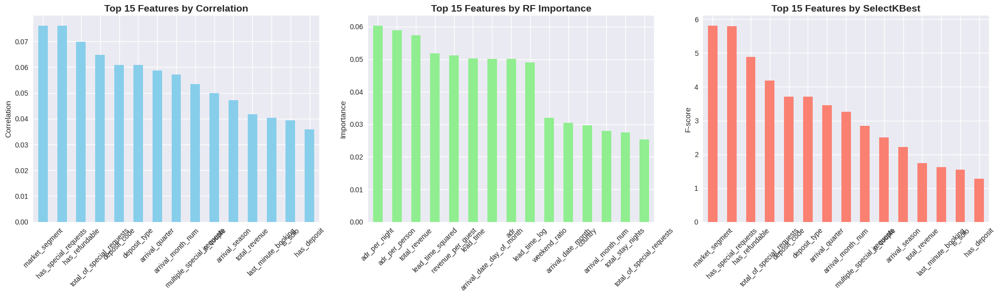


✅ Selected top 20 traditional features:
 1. market_segment (Score: 0.783)
 2. has_special_requests (Score: 0.693)
 3. total_of_special_requests (Score: 0.660)
 4. has_refundable (Score: 0.621)
 5. total_revenue (Score: 0.596)
 6. arrival_month_num (Score: 0.588)
 7. arrival_quarter (Score: 0.541)
 8. deposit_code (Score: 0.534)
 9. deposit_type (Score: 0.533)
10. lead_time_squared (Score: 0.471)
11. multiple_special_requests (Score: 0.432)
12. adr (Score: 0.413)
13. arrival_season (Score: 0.408)
14. adr_per_person (Score: 0.398)
15. lead_time_log (Score: 0.394)
16. is_couple (Score: 0.391)
17. lead_time (Score: 0.382)
18. adr_per_night (Score: 0.380)
19. arrival_date_day_of_month (Score: 0.349)
20. revenue_per_guest (Score: 0.341)


In [24]:
# ============================================
# SECTION 6: TRADITIONAL FEATURE SELECTION METHODS
# ============================================

print("\n🎯 TRADITIONAL FEATURE SELECTION METHODS...")

from sklearn.feature_selection import SelectKBest, f_classif, RFE
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

# Method 1: Correlation with target
print("\n📊 1. Correlation with target (Top 20):")
correlations = X.corrwith(y).abs().sort_values(ascending=False)
top_corr_features = correlations.head(20)
print(top_corr_features)

# Method 2: Random Forest Feature Importance
print("\n🌲 2. Random Forest Feature Importance (Top 20):")
rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
rf.fit(X, y)
importances = pd.Series(rf.feature_importances_, index=X.columns).sort_values(ascending=False)
top_rf_features = importances.head(20)
print(top_rf_features)

# Method 3: SelectKBest (ANOVA F-value)
print("\n⭐ 3. SelectKBest (ANOVA F-value, Top 20):")
selector = SelectKBest(score_func=f_classif, k='all')
selector.fit(X, y)
kbest_scores = pd.Series(selector.scores_, index=X.columns).sort_values(ascending=False)
top_kbest_features = kbest_scores.head(20)
print(top_kbest_features)

# Plot comparison
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Plot 1: Correlation
top_corr_features.head(15).plot(kind='bar', ax=axes[0], color='skyblue')
axes[0].set_title('Top 15 Features by Correlation', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Correlation')
axes[0].tick_params(axis='x', rotation=45)

# Plot 2: RF Importance
top_rf_features.head(15).plot(kind='bar', ax=axes[1], color='lightgreen')
axes[1].set_title('Top 15 Features by RF Importance', fontsize=14, fontweight='bold')
axes[1].set_ylabel('Importance')
axes[1].tick_params(axis='x', rotation=45)

# Plot 3: SelectKBest
top_kbest_features.head(15).plot(kind='bar', ax=axes[2], color='salmon')
axes[2].set_title('Top 15 Features by SelectKBest', fontsize=14, fontweight='bold')
axes[2].set_ylabel('F-score')
axes[2].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.savefig('/content/drive/MyDrive/ai project/feature_selection_methods.png', dpi=300, bbox_inches='tight')
plt.show()

# Combine results
feature_scores = pd.DataFrame({
    'Correlation': correlations,
    'RF_Importance': importances,
    'SelectKBest': kbest_scores
})

# Normalize scores
feature_scores_normalized = feature_scores.apply(lambda x: (x - x.min()) / (x.max() - x.min()))

# Calculate average score
feature_scores_normalized['Average_Score'] = feature_scores_normalized.mean(axis=1)
feature_scores_normalized = feature_scores_normalized.sort_values('Average_Score', ascending=False)

# Select top 20 features
top_n = 20
traditional_features = feature_scores_normalized.head(top_n).index.tolist()

print(f"\n✅ Selected top {top_n} traditional features:")
for i, feat in enumerate(traditional_features, 1):
    avg_score = feature_scores_normalized.loc[feat, 'Average_Score']
    print(f"{i:2d}. {feat} (Score: {avg_score:.3f})")


🧬 GENETIC ALGORITHM FEATURE SELECTION...
Preparing data for Genetic Algorithm...
Running Genetic Algorithm...
  Generation 5/15: Best F1 = 0.5001, Features = 28
  Generation 10/15: Best F1 = 0.5089, Features = 28
  Generation 15/15: Best F1 = 0.5271, Features = 32


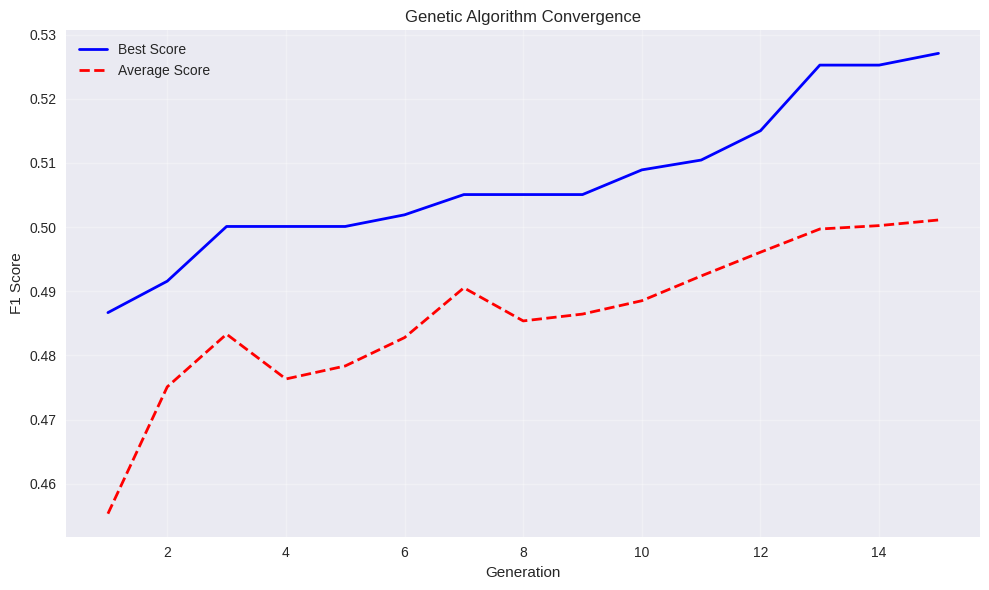


✅ Genetic Algorithm selected 30 features:
  1. lead_time
  2. arrival_date_year
  3. arrival_date_month
  4. children
  5. babies
  6. adr
  7. required_car_parking_spaces
  8. total_of_special_requests
  9. country
 10. market_segment
 11. deposit_type
 12. total_stay_days
 13. weekend_ratio
 14. lead_time_log
 15. last_minute_booking
 16. adults_only
 17. has_children
 18. has_babies
 19. is_solo
 20. adult_ratio
 21. child_ratio
 22. adr_per_person
 23. revenue_per_guest
 24. budget_booking
 25. arrival_month_num
 26. arrival_quarter
 27. high_season
 28. deposit_code
 29. has_non_refundable
 30. multiple_special_requests

💾 GA results saved!


In [25]:
# ============================================
# SECTION 7: GENETIC ALGORITHM FEATURE SELECTION
# ============================================

print("\n🧬 GENETIC ALGORITHM FEATURE SELECTION...")

import random
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression

class GeneticFeatureSelector:
    """Custom Genetic Algorithm for Feature Selection"""

    def __init__(self, n_features, n_population=30, n_generations=15,
                 crossover_rate=0.8, mutation_rate=0.05, elite_size=2, random_state=42):
        self.n_features = n_features
        self.n_population = n_population
        self.n_generations = n_generations
        self.crossover_rate = crossover_rate
        self.mutation_rate = mutation_rate
        self.elite_size = elite_size
        self.random_state = random_state
        np.random.seed(random_state)
        random.seed(random_state)

    def initialize_population(self):
        population = []
        for _ in range(self.n_population):
            individual = np.random.randint(2, size=self.n_features)
            if individual.sum() == 0:
                individual[np.random.randint(self.n_features)] = 1
            population.append(individual)
        return np.array(population)

    def fitness(self, individual, X, y):
        if individual.sum() == 0:
            return -1
        selected_features = np.where(individual == 1)[0]
        X_selected = X[:, selected_features]
        model = LogisticRegression(max_iter=1000, random_state=42)
        scores = cross_val_score(model, X_selected, y, cv=3, scoring='f1')
        return np.mean(scores)

    def tournament_selection(self, population, fitness_scores):
        selected = []
        for _ in range(2):
            indices = np.random.choice(len(population), 3, replace=False)
            tournament_scores = fitness_scores[indices]
            winner_idx = indices[np.argmax(tournament_scores)]
            selected.append(population[winner_idx])
        return selected

    def crossover(self, parent1, parent2):
        if random.random() < self.crossover_rate:
            point = random.randint(1, self.n_features-1)
            child1 = np.concatenate([parent1[:point], parent2[point:]])
            child2 = np.concatenate([parent2[:point], parent1[point:]])
            return child1, child2
        return parent1.copy(), parent2.copy()

    def mutate(self, individual):
        for i in range(self.n_features):
            if random.random() < self.mutation_rate:
                individual[i] = 1 - individual[i]
        if individual.sum() == 0:
            individual[random.randint(0, self.n_features-1)] = 1
        return individual

    def fit(self, X, y, feature_names):
        self.feature_names = feature_names

        # Prepare data
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)

        # Initialize
        population = self.initialize_population()
        best_score = -1
        best_individual = None
        history = []

        print("Running Genetic Algorithm...")
        for gen in range(self.n_generations):
            # Evaluate fitness
            fitness_scores = []
            for individual in population:
                score = self.fitness(individual, X_scaled, y)
                fitness_scores.append(score)

            fitness_scores = np.array(fitness_scores)

            # Track best
            gen_best_idx = np.argmax(fitness_scores)
            gen_best_score = fitness_scores[gen_best_idx]

            if gen_best_score > best_score:
                best_score = gen_best_score
                best_individual = population[gen_best_idx].copy()

            history.append({
                'generation': gen + 1,
                'best_score': gen_best_score,
                'avg_score': np.mean(fitness_scores),
                'n_features': int(population[gen_best_idx].sum())
            })

            # Create new population
            new_population = []

            # Elitism
            elite_indices = np.argsort(fitness_scores)[-self.elite_size:]
            new_population.extend(population[elite_indices])

            # Generate offspring
            while len(new_population) < self.n_population:
                # Selection
                parent1, parent2 = self.tournament_selection(population, fitness_scores)

                # Crossover
                child1, child2 = self.crossover(parent1, parent2)

                # Mutation
                child1 = self.mutate(child1)
                child2 = self.mutate(child2)

                new_population.extend([child1, child2])

            population = np.array(new_population[:self.n_population])

            # Progress update
            if (gen + 1) % 5 == 0:
                print(f"  Generation {gen+1}/{self.n_generations}: "
                      f"Best F1 = {gen_best_score:.4f}, Features = {int(population[gen_best_idx].sum())}")

        # Store results
        self.best_individual = best_individual
        self.best_score = best_score
        self.history = pd.DataFrame(history)

        # Plot convergence
        plt.figure(figsize=(10, 6))
        plt.plot(self.history['generation'], self.history['best_score'], 'b-', linewidth=2, label='Best Score')
        plt.plot(self.history['generation'], self.history['avg_score'], 'r--', linewidth=2, label='Average Score')
        plt.xlabel('Generation')
        plt.ylabel('F1 Score')
        plt.title('Genetic Algorithm Convergence')
        plt.legend()
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.savefig('/content/drive/MyDrive/ai project/ga_convergence.png', dpi=300)
        plt.show()

        return self

    def get_selected_features(self):
        if self.best_individual is None:
            return []
        selected_indices = np.where(self.best_individual == 1)[0]
        return [self.feature_names[i] for i in selected_indices]

    def get_support(self):
        if self.best_individual is None:
            return np.zeros(self.n_features, dtype=bool)
        return self.best_individual.astype(bool)

# Run GA on sample data for speed
print("Preparing data for Genetic Algorithm...")
sample_size = min(2000, len(X))
sample_indices = np.random.choice(len(X), sample_size, replace=False)
X_sample = X.iloc[sample_indices].values
y_sample = y.iloc[sample_indices].values

# Run GA
ga_selector = GeneticFeatureSelector(
    n_features=X.shape[1],
    n_population=25,
    n_generations=15,
    crossover_rate=0.8,
    mutation_rate=0.05,
    elite_size=2,
    random_state=42
)

ga_selector.fit(X_sample, y_sample, X.columns.tolist())

# Get results
ga_features = ga_selector.get_selected_features()
print(f"\n✅ Genetic Algorithm selected {len(ga_features)} features:")
for i, feat in enumerate(ga_features, 1):
    print(f"{i:3d}. {feat}")

# Save GA results
ga_results = {
    'selected_features': ga_features,
    'best_score': float(ga_selector.best_score),
    'n_generations': ga_selector.n_generations,
    'n_population': ga_selector.n_population
}

with open('/content/drive/MyDrive/ai project/ga_results.json', 'w') as f:
    json.dump(ga_results, f, indent=4)

print("\n💾 GA results saved!")


📊 FEATURE SELECTION COMPARISON...

FEATURE SELECTION COMPARISON
                 name  n_features  accuracy  precision  recall     f1
         All Features          51     0.515     0.4875  0.4105 0.4457
Traditional Selection          20     0.555     0.5357  0.4737 0.5028
    Genetic Algorithm          30     0.480     0.4494  0.4211 0.4348


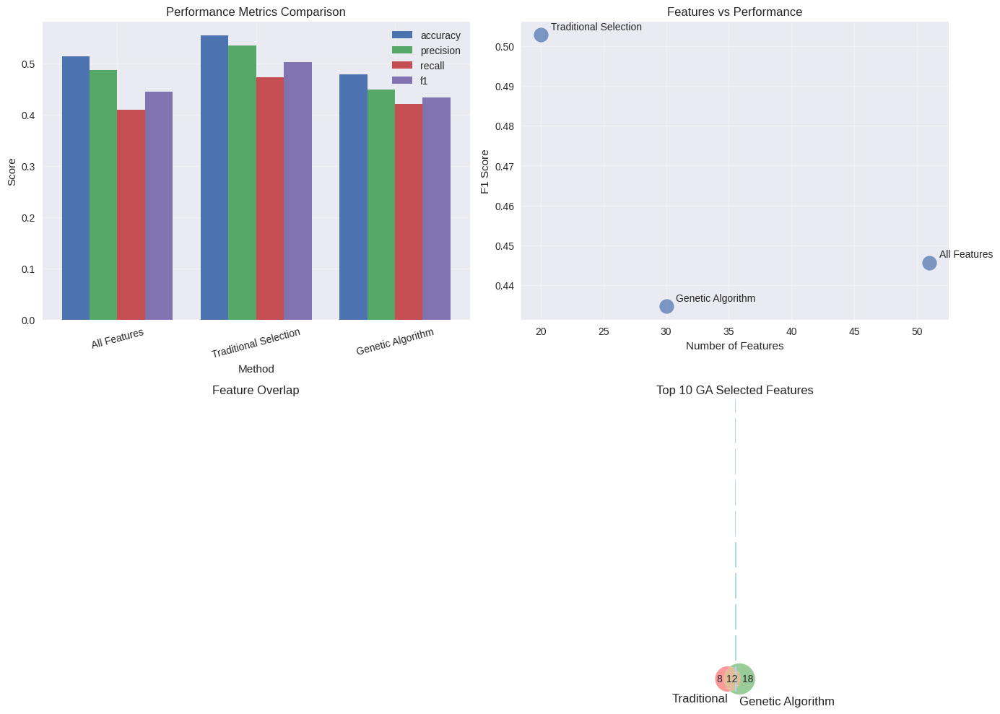


🏆 BEST METHOD: Traditional Selection
   • Features: 20
   • F1-Score: 0.5028
   • Accuracy: 0.5550


In [26]:
# ============================================
# SECTION 8: FEATURE SELECTION COMPARISON
# ============================================

print("\n📊 FEATURE SELECTION COMPARISON...")

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Prepare data for evaluation
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Define feature sets
all_features = X.columns.tolist()
traditional_set = traditional_features
ga_set = ga_features

# Function to evaluate feature set
def evaluate_feature_set(features, name):
    if len(features) == 0:
        return {'name': name, 'accuracy': 0, 'n_features': 0}

    X_train_sub = X_train[features]
    X_test_sub = X_test[features]

    # Scale features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train_sub)
    X_test_scaled = scaler.transform(X_test_sub)

    # Train model
    model = RandomForestClassifier(n_estimators=50, random_state=42, n_jobs=-1)
    model.fit(X_train_scaled, y_train)

    # Predict
    y_pred = model.predict(X_test_scaled)

    # Calculate metrics
    return {
        'name': name,
        'n_features': len(features),
        'accuracy': accuracy_score(y_test, y_pred),
        'precision': precision_score(y_test, y_pred),
        'recall': recall_score(y_test, y_pred),
        'f1': f1_score(y_test, y_pred)
    }

# Evaluate all feature sets
results = [
    evaluate_feature_set(all_features, "All Features"),
    evaluate_feature_set(traditional_set, "Traditional Selection"),
    evaluate_feature_set(ga_set, "Genetic Algorithm")
]

# Create comparison DataFrame
comparison_df = pd.DataFrame(results)
print("\n" + "="*70)
print("FEATURE SELECTION COMPARISON")
print("="*70)
print(comparison_df.round(4).to_string(index=False))

# Plot comparison
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Plot 1: Performance metrics
metrics = ['accuracy', 'precision', 'recall', 'f1']
x_pos = np.arange(len(comparison_df))
width = 0.2

for i, metric in enumerate(metrics):
    axes[0, 0].bar(x_pos + i*width, comparison_df[metric], width, label=metric)

axes[0, 0].set_xlabel('Method')
axes[0, 0].set_ylabel('Score')
axes[0, 0].set_title('Performance Metrics Comparison')
axes[0, 0].set_xticks(x_pos + width*1.5)
axes[0, 0].set_xticklabels(comparison_df['name'], rotation=15)
axes[0, 0].legend()
axes[0, 0].grid(True, alpha=0.3)

# Plot 2: Features vs Performance
axes[0, 1].scatter(comparison_df['n_features'], comparison_df['f1'], s=200, alpha=0.7)
for i, row in comparison_df.iterrows():
    axes[0, 1].annotate(row['name'], (row['n_features'], row['f1']),
                       xytext=(10, 5), textcoords='offset points')
axes[0, 1].set_xlabel('Number of Features')
axes[0, 1].set_ylabel('F1 Score')
axes[0, 1].set_title('Features vs Performance')
axes[0, 1].grid(True, alpha=0.3)

# Plot 3: Feature overlap
if traditional_set and ga_set:
    from matplotlib_venn import venn2
    venn = venn2([set(traditional_set), set(ga_set)],
                 set_labels=('Traditional', 'Genetic Algorithm'))
    axes[1, 0].set_title('Feature Overlap')
else:
    axes[1, 0].text(0.5, 0.5, 'No overlap data', ha='center', va='center')
axes[1, 0].axis('off')

# Plot 4: Feature importance of GA selected features
if ga_set:
    ga_importances = importances[ga_set].sort_values(ascending=False).head(10)
    axes[1, 1].barh(range(len(ga_importances)), ga_importances.values, color='lightblue')
    axes[1, 1].set_yticks(range(len(ga_importances)))
    axes[1, 1].set_yticklabels(ga_importances.index)
    axes[1, 1].set_xlabel('Importance')
    axes[1, 1].set_title('Top 10 GA Selected Features')
    axes[1, 1].grid(True, alpha=0.3, axis='x')

plt.tight_layout()
plt.savefig('/content/drive/MyDrive/ai project/feature_comparison.png', dpi=300)
plt.show()

# Determine best method
best_method = comparison_df.loc[comparison_df['f1'].idxmax(), 'name']
best_features = ga_set if best_method == 'Genetic Algorithm' else traditional_set

print(f"\n🏆 BEST METHOD: {best_method}")
print(f"   • Features: {len(best_features)}")
print(f"   • F1-Score: {comparison_df.loc[comparison_df['f1'].idxmax(), 'f1']:.4f}")
print(f"   • Accuracy: {comparison_df.loc[comparison_df['f1'].idxmax(), 'accuracy']:.4f}")

In [27]:
# ============================================
# SECTION 9: FINAL DATASET PREPARATION
# ============================================

print("\n💾 FINAL DATASET PREPARATION...")

# Select final features (use GA if better, otherwise traditional)
if 'Genetic Algorithm' in comparison_df['name'].values:
    if comparison_df.loc[comparison_df['name'] == 'Genetic Algorithm', 'f1'].values[0] >= \
       comparison_df.loc[comparison_df['name'] == 'Traditional Selection', 'f1'].values[0]:
        final_features = ga_features
        selection_method = "Genetic Algorithm"
    else:
        final_features = traditional_features
        selection_method = "Traditional Methods"
else:
    final_features = traditional_features
    selection_method = "Traditional Methods"

print(f"Using {selection_method} with {len(final_features)} features")

# Create final dataset
X_final = X[final_features].copy()
final_dataset = pd.concat([X_final, y], axis=1)

print(f"\n📊 Final dataset shape: {final_dataset.shape}")
print(f"Features: {final_dataset.shape[1]-1}, Samples: {final_dataset.shape[0]}")

# Save final dataset
output_path = '/content/drive/MyDrive/ai project/final_engineered_features.csv'
final_dataset.to_csv(output_path, index=False)
print(f"✅ Final dataset saved to: {output_path}")

# Save feature information
feature_info = {
    'selected_features': final_features,
    'n_features': len(final_features),
    'selection_method': selection_method,
    'dataset_shape': final_dataset.shape,
    'original_features': original_feature_count,
    'engineered_features': df.shape[1] - original_feature_count,
    'performance_metrics': comparison_df.to_dict('records'),
    'feature_importance': importances[final_features].to_dict() if all(f in importances.index for f in final_features) else {}
}

with open('/content/drive/MyDrive/ai project/feature_selection_info.json', 'w') as f:
    json.dump(feature_info, f, indent=4)
print("✅ Feature information saved!")

# Save scaler
scaler = StandardScaler()
scaler.fit(X_final)
with open('/content/drive/MyDrive/ai project/scaler.pkl', 'wb') as f:
    pickle.dump(scaler, f)
print("✅ Scaler saved!")

# Summary report
print("\n" + "="*70)
print("FEATURE ENGINEERING & SELECTION - FINAL REPORT")
print("="*70)
print(f"Original dataset features: {original_feature_count}")
print(f"Engineered features created: {df.shape[1] - original_feature_count}")
print(f"Final selected features: {len(final_features)}")
print(f"Feature reduction: {((original_feature_count - len(final_features)) / original_feature_count * 100):.1f}%")
print(f"Best F1-Score achieved: {comparison_df['f1'].max():.4f}")
print(f"\nTop 5 most important features:")
if all(f in importances.index for f in final_features):
    top_5 = importances[final_features].sort_values(ascending=False).head(5)
    for feat, imp in top_5.items():
        print(f"  • {feat}: {imp:.4f}")

print("\n✅ Process complete! Dataset is ready for modeling.")
print(f"📁 Files saved to Google Drive:")
print(f"   • final_engineered_features.csv")
print(f"   • feature_selection_info.json")
print(f"   • scaler.pkl")
print(f"   • label_encoders.pkl")


💾 FINAL DATASET PREPARATION...
Using Traditional Methods with 20 features

📊 Final dataset shape: (1000, 21)
Features: 20, Samples: 1000
✅ Final dataset saved to: /content/drive/MyDrive/ai project/final_engineered_features.csv
✅ Feature information saved!
✅ Scaler saved!

FEATURE ENGINEERING & SELECTION - FINAL REPORT
Original dataset features: 20
Engineered features created: 35
Final selected features: 20
Feature reduction: 0.0%
Best F1-Score achieved: 0.5028

Top 5 most important features:
  • adr_per_night: 0.0603
  • adr_per_person: 0.0589
  • total_revenue: 0.0573
  • lead_time_squared: 0.0518
  • revenue_per_guest: 0.0512

✅ Process complete! Dataset is ready for modeling.
📁 Files saved to Google Drive:
   • final_engineered_features.csv
   • feature_selection_info.json
   • scaler.pkl
   • label_encoders.pkl


In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
import pickle
import json
import warnings
warnings.filterwarnings('ignore')

# Set display options
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)
plt.style.use('seaborn-v0_8-darkgrid')

# Set your local directory path
BASE_PATH = r"/content/drive/My Drive/ai project/"

print(f"📁 Working directory: {BASE_PATH}")

📁 Working directory: /content/drive/My Drive/ai project/


In [29]:
# ============================================
# STEP 1: LOAD FINAL DATASET
# ============================================

print("\n📊 STEP 1: LOADING FINAL ENGINEERED DATASET")

try:
    final_df = pd.read_csv(BASE_PATH + "final_engineered_features.csv")
    print(f"✅ Dataset loaded successfully!")
    print(f"   Shape: {final_df.shape}")
    print(f"   Columns: {len(final_df.columns)}")
    print(f"\n📋 First few rows:")
    print(final_df.head())

    print(f"\n🎯 Target distribution:")
    target_counts = final_df['is_canceled'].value_counts()
    target_percent = final_df['is_canceled'].value_counts(normalize=True) * 100
    for idx in target_counts.index:
        print(f"   Class {idx}: {target_counts[idx]} samples ({target_percent[idx]:.1f}%)")

except FileNotFoundError:
    print("❌ ERROR: 'final_engineered_features.csv' not found!")
    print("Make sure the file exists in your directory.")
    print("Available files should include:")
    print("  - final_engineered_features.csv")
    print("  - scaler.pkl")
    print("  - feature_selection_info.json")
    raise


📊 STEP 1: LOADING FINAL ENGINEERED DATASET
✅ Dataset loaded successfully!
   Shape: (1000, 21)
   Columns: 21

📋 First few rows:
   market_segment  has_special_requests  total_of_special_requests  has_refundable  total_revenue  arrival_month_num  arrival_quarter  deposit_code  deposit_type  lead_time_squared  multiple_special_requests         adr  arrival_season  adr_per_person  lead_time_log  is_couple  lead_time  adr_per_night  arrival_date_day_of_month  revenue_per_guest  is_canceled
0               3                     1                          1               1     337.960135                  6                3             2             2              91204                          0   67.592027               2       22.530676       5.713733          0        302      13.518405                         25         112.653378            1
1               2                     1                          3               0     831.034176                  6                3           

In [30]:
# ============================================
# STEP 2: PREPARE DATA FOR MODELING
# ============================================

print("\n🔧 STEP 2: PREPARING DATA FOR MODELING")

# Separate features and target
X = final_df.drop('is_canceled', axis=1)
y = final_df['is_canceled']

# Split into train, validation, and test sets (60-20-20 split)
X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=0.25, random_state=42, stratify=y_temp  # 0.25 * 0.8 = 0.2
)

print(f"✅ Data split completed:")
print(f"   Training set:   {X_train.shape[0]} samples")
print(f"   Validation set: {X_val.shape[0]} samples")
print(f"   Test set:       {X_test.shape[0]} samples")




🔧 STEP 2: PREPARING DATA FOR MODELING
✅ Data split completed:
   Training set:   600 samples
   Validation set: 200 samples
   Test set:       200 samples


In [31]:
# ============================================
# STEP 3: SCALE THE FEATURES
# ============================================

print("\n⚖️ STEP 3: SCALING FEATURES")

try:
    with open(BASE_PATH + "scaler.pkl", 'rb') as f:
        scaler = pickle.load(f)
    print("✅ Scaler loaded from file")

    # Scale the features
    X_train_scaled = scaler.transform(X_train)
    X_val_scaled = scaler.transform(X_val)
    X_test_scaled = scaler.transform(X_test)

    print("✅ Features scaled successfully")

except FileNotFoundError:
    print("⚠️ Scaler file not found. Creating new scaler...")
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_val_scaled = scaler.transform(X_val)
    X_test_scaled = scaler.transform(X_test)

    # Save the scaler for Person 5
    with open(BASE_PATH + "scaler_new.pkl", 'wb') as f:
        pickle.dump(scaler, f)
    print("✅ New scaler created and saved")



⚖️ STEP 3: SCALING FEATURES
✅ Scaler loaded from file
✅ Features scaled successfully


In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
import pickle
import json
import warnings
warnings.filterwarnings('ignore')

# Set display options
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)
plt.style.use('seaborn-v0_8-darkgrid')

# Set your local directory path
BASE_PATH = r"/content/drive/My Drive/ai project/"

print(f"📁 Working directory: {BASE_PATH}")


# ============================================
# STEP 4: K-NEAREST NEIGHBORS MODEL
# ============================================

print("\n" + "="*60)
print("K-NEAREST NEIGHBORS (KNN) CLASSIFIER")
print("="*60)

def train_knn_with_tuning(X_train, y_train, X_val, y_val):
    """Train and tune KNN classifier"""

    print("\n🔍 Tuning hyperparameters...")

    # Define parameter grid (smaller for faster execution)
    param_grid = {
        'n_neighbors': [3, 7, 11],
        'weights': ['uniform', 'distance'],
        'metric': ['euclidean', 'manhattan']
    }

    # Initialize KNN
    knn = KNeighborsClassifier()

    # Use GridSearchCV for hyperparameter tuning
    print("   Running GridSearchCV (this may take a moment)...")
    grid_search = GridSearchCV(
        knn,
        param_grid,
        cv=2,  # Reduced for speed
        scoring='f1',
        n_jobs=-1,
        verbose=0
    )

    # Fit the model
    grid_search.fit(X_train, y_train)

    # Get best model
    best_knn = grid_search.best_estimator_
    best_params = grid_search.best_params_

    print(f"\n✅ Best Parameters Found:")
    for param, value in best_params.items():
        print(f"   {param}: {value}")

    # Evaluate on validation set
    y_val_pred = best_knn.predict(X_val)

    # Calculate metrics
    knn_metrics = {
        'accuracy': accuracy_score(y_val, y_val_pred),
        'precision': precision_score(y_val, y_val_pred, zero_division=0),
        'recall': recall_score(y_val, y_val_pred),
        'f1': f1_score(y_val, y_val_pred)
    }

    print(f"\n📊 Validation Performance:")
    print(f"   Accuracy:  {knn_metrics['accuracy']:.4f}")
    print(f"   Precision: {knn_metrics['precision']:.4f}")
    print(f"   Recall:    {knn_metrics['recall']:.4f}")
    print(f"   F1-Score:  {knn_metrics['f1']:.4f}")

    return best_knn, knn_metrics, best_params

# Train KNN
best_knn, knn_metrics, knn_params = train_knn_with_tuning(
    X_train_scaled, y_train, X_val_scaled, y_val
)

📁 Working directory: /content/drive/My Drive/ai project/

K-NEAREST NEIGHBORS (KNN) CLASSIFIER

🔍 Tuning hyperparameters...
   Running GridSearchCV (this may take a moment)...

✅ Best Parameters Found:
   metric: euclidean
   n_neighbors: 11
   weights: distance

📊 Validation Performance:
   Accuracy:  0.4600
   Precision: 0.4058
   Recall:    0.2947
   F1-Score:  0.3415


In [33]:
# ============================================
# STEP 5: DECISION TREE MODEL
# ============================================

print("\n" + "="*60)
print("DECISION TREE CLASSIFIER")
print("="*60)

def train_decision_tree_with_tuning(X_train, y_train, X_val, y_val):
    """Train and tune Decision Tree classifier"""

    print("\n🌳 Tuning hyperparameters...")

    # Define parameter grid
    param_grid = {
        'max_depth': [5, 10, 15, 20, None],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4],
        'criterion': ['gini', 'entropy']
    }

    # Initialize Decision Tree
    dt = DecisionTreeClassifier(random_state=42)

    # Use GridSearchCV for hyperparameter tuning
    print("   Running GridSearchCV...")
    grid_search = GridSearchCV(
        dt,
        param_grid,
        cv=3,  # Reduced for speed
        scoring='f1',
        n_jobs=-1,
        verbose=0
    )

    # Fit the model
    grid_search.fit(X_train, y_train)

    # Get best model
    best_dt = grid_search.best_estimator_
    best_params = grid_search.best_params_

    print(f"\n✅ Best Parameters Found:")
    for param, value in best_params.items():
        print(f"   {param}: {value}")

    # Evaluate on validation set
    y_val_pred = best_dt.predict(X_val)

    # Calculate metrics
    dt_metrics = {
        'accuracy': accuracy_score(y_val, y_val_pred),
        'precision': precision_score(y_val, y_val_pred, zero_division=0),
        'recall': recall_score(y_val, y_val_pred),
        'f1': f1_score(y_val, y_val_pred)
    }

    print(f"\n📊 Validation Performance:")
    print(f"   Accuracy:  {dt_metrics['accuracy']:.4f}")
    print(f"   Precision: {dt_metrics['precision']:.4f}")
    print(f"   Recall:    {dt_metrics['recall']:.4f}")
    print(f"   F1-Score:  {dt_metrics['f1']:.4f}")

    return best_dt, dt_metrics, best_params

# Train Decision Tree
best_dt, dt_metrics, dt_params = train_decision_tree_with_tuning(
    X_train_scaled, y_train, X_val_scaled, y_val
)




DECISION TREE CLASSIFIER

🌳 Tuning hyperparameters...
   Running GridSearchCV...

✅ Best Parameters Found:
   criterion: gini
   max_depth: 20
   min_samples_leaf: 1
   min_samples_split: 10

📊 Validation Performance:
   Accuracy:  0.5200
   Precision: 0.4935
   Recall:    0.4000
   F1-Score:  0.4419



MODEL COMPARISON - VALIDATION SET

📈 Performance Comparison:
               accuracy  precision  recall      f1
KNN                0.46     0.4058  0.2947  0.3415
Decision Tree      0.52     0.4935  0.4000  0.4419


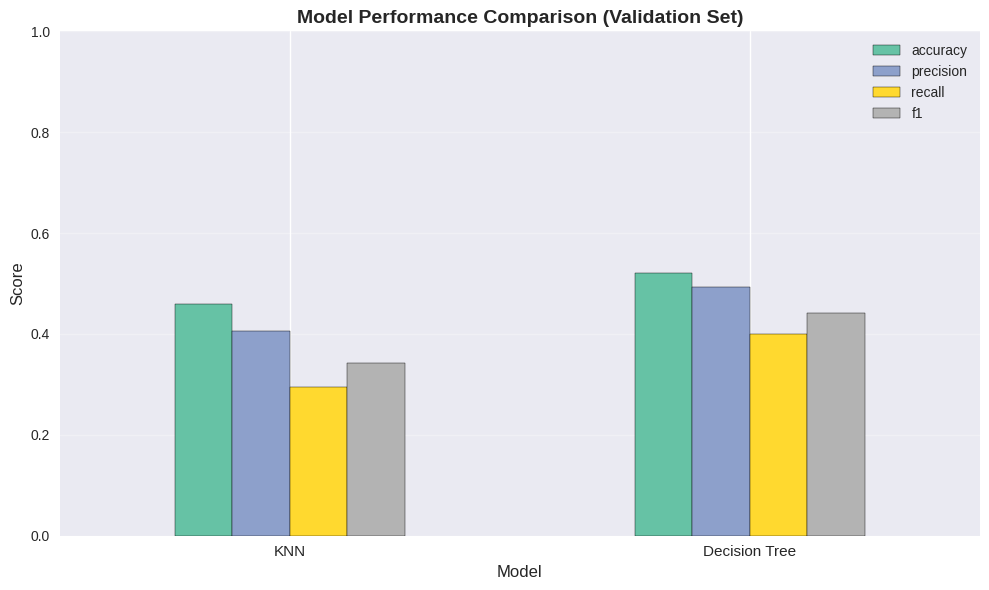

💾 Plot saved: /content/drive/My Drive/ai project/model_validation_comparison.png
💾 CSV saved: /content/drive/My Drive/ai project/model_validation_comparison.csv


In [34]:
# ============================================
# STEP 6: COMPARE VALIDATION PERFORMANCE
# ============================================

print("\n" + "="*60)
print("MODEL COMPARISON - VALIDATION SET")
print("="*60)

# Create comparison table
comparison_df = pd.DataFrame({
    'KNN': knn_metrics,
    'Decision Tree': dt_metrics
}).T

print("\n📈 Performance Comparison:")
print(comparison_df.round(4))

# Plot comparison
fig, ax = plt.subplots(figsize=(10, 6))
comparison_df.plot(kind='bar', ax=ax, colormap='Set2', edgecolor='black')
ax.set_title('Model Performance Comparison (Validation Set)', fontsize=14, fontweight='bold')
ax.set_ylabel('Score', fontsize=12)
ax.set_xlabel('Model', fontsize=12)
ax.set_ylim([0, 1])
ax.legend(loc='upper right', fontsize=10)
plt.xticks(rotation=0, fontsize=11)
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()

# Save the plot
plt.savefig(BASE_PATH + "model_validation_comparison.png", dpi=300, bbox_inches='tight')
plt.show()
print(f"💾 Plot saved: {BASE_PATH}model_validation_comparison.png")

# Save comparison to CSV
comparison_df.to_csv(BASE_PATH + "model_validation_comparison.csv")
print(f"💾 CSV saved: {BASE_PATH}model_validation_comparison.csv")


FEATURE IMPORTANCE ANALYSIS


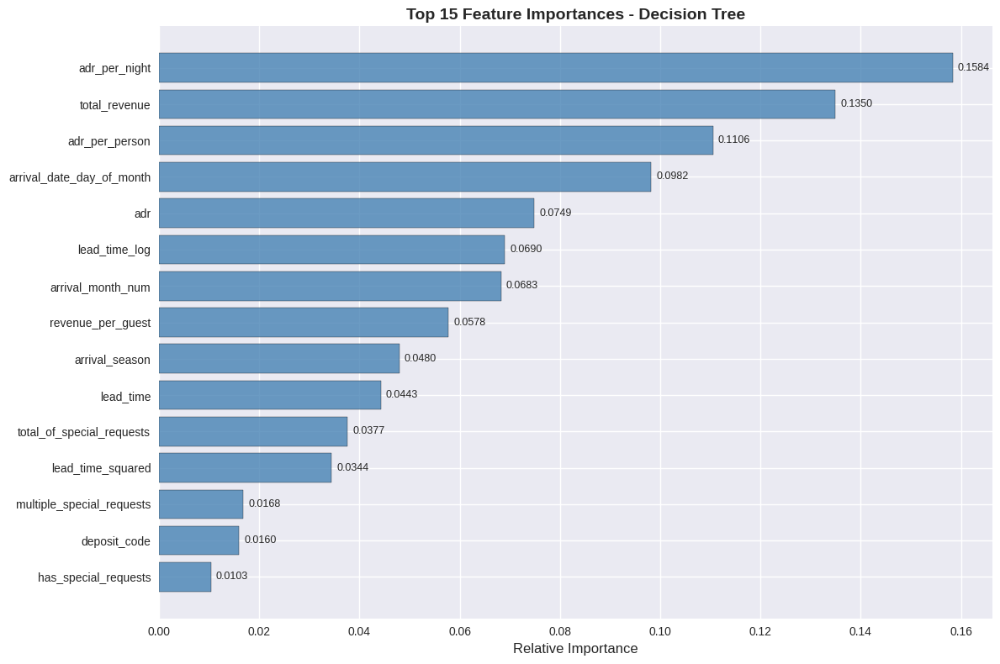

✅ Top 15 Most Important Features:
    1. adr_per_night: 0.1584
    2. total_revenue: 0.1350
    3. adr_per_person: 0.1106
    4. arrival_date_day_of_month: 0.0982
    5. adr: 0.0749
    6. lead_time_log: 0.0690
    7. arrival_month_num: 0.0683
    8. revenue_per_guest: 0.0578
    9. arrival_season: 0.0480
   10. lead_time: 0.0443
   11. total_of_special_requests: 0.0377
   12. lead_time_squared: 0.0344
   13. multiple_special_requests: 0.0168
   14. deposit_code: 0.0160
   15. has_special_requests: 0.0103
💾 Plot saved: /content/drive/My Drive/ai project/decision_tree_feature_importance.png
💾 CSV saved: /content/drive/My Drive/ai project/decision_tree_feature_importance.csv


In [35]:
# ============================================
# STEP 7: FEATURE IMPORTANCE (DECISION TREE)
# ============================================

print("\n" + "="*60)
print("FEATURE IMPORTANCE ANALYSIS")
print("="*60)

def plot_and_save_feature_importance(model, feature_names, top_n=15):
    """Plot and save feature importance for Decision Tree"""

    if hasattr(model, 'feature_importances_'):
        importances = model.feature_importances_
        indices = np.argsort(importances)[::-1]

        # Plot top N features
        plt.figure(figsize=(12, 8))
        plt.title(f'Top {top_n} Feature Importances - Decision Tree', fontsize=14, fontweight='bold')
        bars = plt.barh(range(top_n), importances[indices[:top_n]][::-1],
                       color='steelblue', edgecolor='black', alpha=0.8)
        plt.yticks(range(top_n), [feature_names[i] for i in indices[:top_n]][::-1], fontsize=10)
        plt.xlabel('Relative Importance', fontsize=12)

        # Add value labels
        for i, (bar, importance) in enumerate(zip(bars, importances[indices[:top_n]][::-1])):
            plt.text(bar.get_width() + 0.001, bar.get_y() + bar.get_height()/2,
                    f'{importance:.4f}', va='center', fontsize=9)

        plt.tight_layout()
        plt.savefig(BASE_PATH + "decision_tree_feature_importance.png", dpi=300, bbox_inches='tight')
        plt.show()

        # Create and save feature importance DataFrame
        feature_importance_df = pd.DataFrame({
            'feature': feature_names,
            'importance': importances
        }).sort_values('importance', ascending=False)

        feature_importance_df.to_csv(BASE_PATH + "decision_tree_feature_importance.csv", index=False)

        print(f"✅ Top {top_n} Most Important Features:")
        for i, idx in enumerate(indices[:top_n]):
            print(f"   {i+1:2d}. {feature_names[idx]}: {importances[idx]:.4f}")

        print(f"💾 Plot saved: {BASE_PATH}decision_tree_feature_importance.png")
        print(f"💾 CSV saved: {BASE_PATH}decision_tree_feature_importance.csv")

        return feature_importance_df
    else:
        print("⚠️ Model doesn't have feature_importances_ attribute")
        return None

# Plot feature importance
feature_importance_df = plot_and_save_feature_importance(best_dt, X.columns.tolist())

In [36]:
# ============================================
# STEP 8: SAVE MODELS AND ARTIFACTS
# ============================================

print("\n" + "="*60)
print("SAVING MODELS AND ARTIFACTS")
print("="*60)

def save_all_artifacts(knn_model, dt_model, knn_metrics, dt_metrics, knn_params, dt_params):
    """Save all models and related information"""

    # Save KNN model
    with open(BASE_PATH + "knn_model.pkl", 'wb') as f:
        pickle.dump(knn_model, f)
    print("✅ KNN model saved: knn_model.pkl")

    # Save Decision Tree model
    with open(BASE_PATH + "decision_tree_model.pkl", 'wb') as f:
        pickle.dump(dt_model, f)
    print("✅ Decision Tree model saved: decision_tree_model.pkl")

    # Save model information
    model_info = {
        'KNN': {
            'parameters': knn_params,
            'validation_metrics': knn_metrics,
            'test_data_info': {
                'X_test_shape': X_test_scaled.shape,
                'y_test_shape': y_test.shape
            }
        },
        'Decision_Tree': {
            'parameters': dt_params,
            'validation_metrics': dt_metrics,
            'test_data_info': {
                'X_test_shape': X_test_scaled.shape,
                'y_test_shape': y_test.shape
            }
        },
        'dataset_info': {
            'original_shape': final_df.shape,
            'train_samples': len(X_train),
            'val_samples': len(X_val),
            'test_samples': len(X_test),
            'feature_names': X.columns.tolist()
        }
    }

    with open(BASE_PATH + "model_info.json", 'w') as f:
        json.dump(model_info, f, indent=4)
    print("✅ Model info saved: model_info.json")

    # Save test data for Person 5
    test_data = {
        'X_test_scaled': X_test_scaled,
        'y_test': y_test.values,
        'feature_names': X.columns.tolist()
    }

    with open(BASE_PATH + "test_data.pkl", 'wb') as f:
        pickle.dump(test_data, f)
    print("✅ Test data saved: test_data.pkl")

# Save all artifacts
save_all_artifacts(best_knn, best_dt, knn_metrics, dt_metrics, knn_params, dt_params)


SAVING MODELS AND ARTIFACTS
✅ KNN model saved: knn_model.pkl
✅ Decision Tree model saved: decision_tree_model.pkl
✅ Model info saved: model_info.json
✅ Test data saved: test_data.pkl


In [37]:
# ============================================
# STEP 9: FINAL DELIVERABLES SUMMARY
# ============================================

print("\n" + "="*70)
print("PERSON 4 - DELIVERABLES COMPLETE! 🎉")
print("="*70)

print("\n📋 YOUR DELIVERABLES:")

deliverables = [
    ("Trained Models", [
        f"✓ K-Nearest Neighbors (best_knn)",
        f"   - Best k: {knn_params.get('n_neighbors', 'N/A')}",
        f"   - Validation F1: {knn_metrics['f1']:.4f}",
        f"✓ Decision Tree Classifier (best_dt)",
        f"   - Max depth: {dt_params.get('max_depth', 'N/A')}",
        f"   - Validation F1: {dt_metrics['f1']:.4f}"
    ]),

    ("Saved Files", [
        f"✓ {BASE_PATH}knn_model.pkl",
        f"✓ {BASE_PATH}decision_tree_model.pkl",
        f"✓ {BASE_PATH}model_info.json",
        f"✓ {BASE_PATH}test_data.pkl",
        f"✓ {BASE_PATH}model_validation_comparison.csv",
        f"✓ {BASE_PATH}model_validation_comparison.png",
        f"✓ {BASE_PATH}decision_tree_feature_importance.csv",
        f"✓ {BASE_PATH}decision_tree_feature_importance.png"
    ]),

    ("Performance Metrics", [
        f"✓ Accuracy: KNN={knn_metrics['accuracy']:.4f}, DT={dt_metrics['accuracy']:.4f}",
        f"✓ Precision: KNN={knn_metrics['precision']:.4f}, DT={dt_metrics['precision']:.4f}",
        f"✓ Recall: KNN={knn_metrics['recall']:.4f}, DT={dt_metrics['recall']:.4f}",
        f"✓ F1-Score: KNN={knn_metrics['f1']:.4f}, DT={dt_metrics['f1']:.4f}"
    ]),

    ("Ready for Person 5", [
        "✓ All trained models saved",
        "✓ Test data prepared and saved",
        "✓ Performance metrics documented",
        "✓ Visualizations generated",
        "✓ Hyperparameter tuning completed"
    ])
]

for category, items in deliverables:
    print(f"\n{category}:")
    for item in items:
        print(f"  {item}")

print("\n" + "="*70)
print("NEXT STEPS FOR PERSON 5:")
print("="*70)
print("1. Load 'knn_model.pkl' and 'decision_tree_model.pkl'")
print("2. Load 'test_data.pkl' for final evaluation")
print("3. Implement Neural Network (MLPClassifier)")
print("4. Compare all 3 models on the test set")
print("5. Generate final comparison and select best model")

print("\n🎯 Best performing model on validation:")
if knn_metrics['f1'] > dt_metrics['f1']:
    print(f"   → KNN (F1: {knn_metrics['f1']:.4f} vs DT: {dt_metrics['f1']:.4f})")
else:
    print(f"   → Decision Tree (F1: {dt_metrics['f1']:.4f} vs KNN: {knn_metrics['f1']:.4f})")

print("\n✅ Person 4 tasks completed successfully!")


PERSON 4 - DELIVERABLES COMPLETE! 🎉

📋 YOUR DELIVERABLES:

Trained Models:
  ✓ K-Nearest Neighbors (best_knn)
     - Best k: 11
     - Validation F1: 0.3415
  ✓ Decision Tree Classifier (best_dt)
     - Max depth: 20
     - Validation F1: 0.4419

Saved Files:
  ✓ /content/drive/My Drive/ai project/knn_model.pkl
  ✓ /content/drive/My Drive/ai project/decision_tree_model.pkl
  ✓ /content/drive/My Drive/ai project/model_info.json
  ✓ /content/drive/My Drive/ai project/test_data.pkl
  ✓ /content/drive/My Drive/ai project/model_validation_comparison.csv
  ✓ /content/drive/My Drive/ai project/model_validation_comparison.png
  ✓ /content/drive/My Drive/ai project/decision_tree_feature_importance.csv
  ✓ /content/drive/My Drive/ai project/decision_tree_feature_importance.png

Performance Metrics:
  ✓ Accuracy: KNN=0.4600, DT=0.5200
  ✓ Precision: KNN=0.4058, DT=0.4935
  ✓ Recall: KNN=0.2947, DT=0.4000
  ✓ F1-Score: KNN=0.3415, DT=0.4419

Ready for Person 5:
  ✓ All trained models saved
  ✓ Te

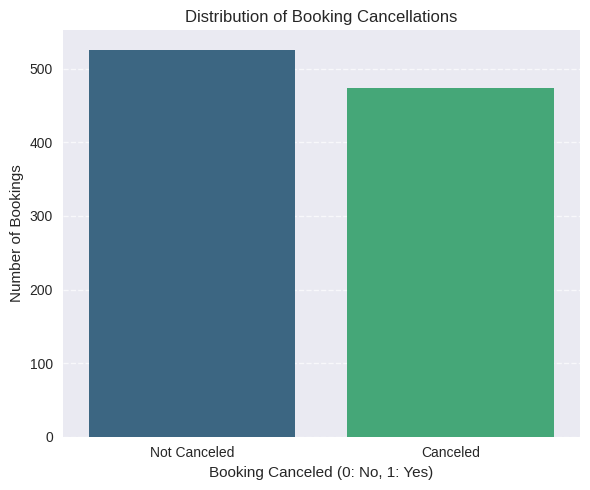

💾 Plot saved: /content/drive/My Drive/ai project/target_distribution.png


In [38]:
# Visualize target distribution
plt.figure(figsize=(6, 5))
sns.countplot(x='is_canceled', data=final_df, palette='viridis')
plt.title('Distribution of Booking Cancellations')
plt.xlabel('Booking Canceled (0: No, 1: Yes)')
plt.ylabel('Number of Bookings')
plt.xticks([0, 1], ['Not Canceled', 'Canceled'])
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig(BASE_PATH + "target_distribution.png", dpi=300, bbox_inches='tight')
plt.show()
print(f"💾 Plot saved: {BASE_PATH}target_distribution.png")

Training set: (600, 20), (600,)
Validation set: (200, 20), (200,)
Test set: (200, 20), (200,)
Class distribution (train): [316 284]
Class distribution (val): [105  95]
Class distribution (test): [105  95]

NEURAL NETWORK MODEL
Tuning neural network hyperparameters...
Fitting 3 folds for each of 288 candidates, totalling 864 fits
Best parameters for Neural Network: {'activation': 'logistic', 'alpha': 0.0001, 'hidden_layer_sizes': (100, 50), 'learning_rate': 'constant', 'max_iter': 500, 'solver': 'sgd'}
Best validation F1 score: 0.6425

Neural Network Validation Performance:
Accuracy: 0.4750
Precision: 0.2256
Recall: 0.4750
F1-Score: 0.3059

LOADING/TRAINING OTHER MODELS

Tuning KNN model...
Fitting 3 folds for each of 20 candidates, totalling 60 fits
Best KNN parameters: {'metric': 'manhattan', 'n_neighbors': 11, 'weights': 'distance'}

Tuning Decision Tree model...
Fitting 3 folds for each of 90 candidates, totalling 270 fits
Best Decision Tree parameters: {'criterion': 'gini', 'max_de

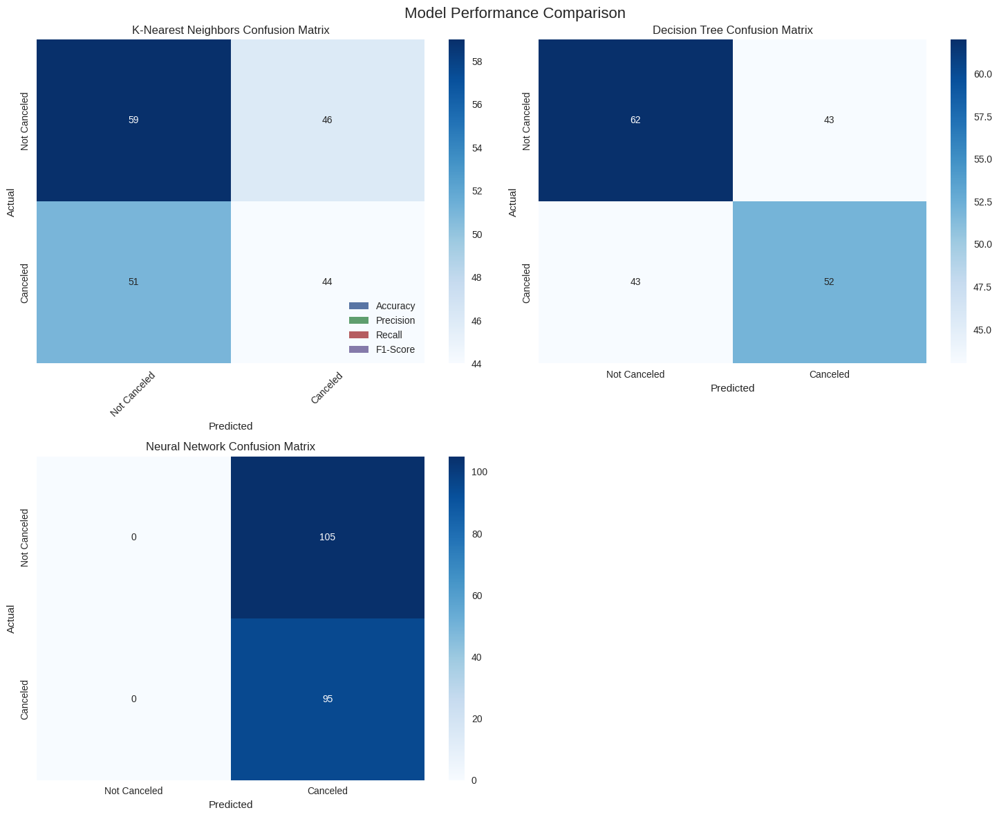


BEST MODEL SELECTION & JUSTIFICATION

Selected Best Model: Decision Tree
Primary Reason: Highest F1-Score (0.5700)

Justification for model selection:
1. F1-Score is chosen as the primary metric because it provides a balanced
   measure of precision and recall, which is important for imbalanced datasets.
2. The selected model shows the best trade-off between false positives and
   false negatives.
3. Additional considerations:
   - Training time and complexity
   - Interpretability (if needed for business stakeholders)
   - Scalability for future data

FINAL RECOMMENDATIONS

1. Use the selected model for predicting hotel booking cancellations.
2. Monitor model performance regularly with new data.
3. Consider retraining the model quarterly to adapt to changing patterns.
4. For production deployment, ensure proper data preprocessing pipeline.
5. Implement a feedback loop to continuously improve model accuracy.

Best model saved as 'best_hotel_cancellation_model.pkl'

Feature Importance 

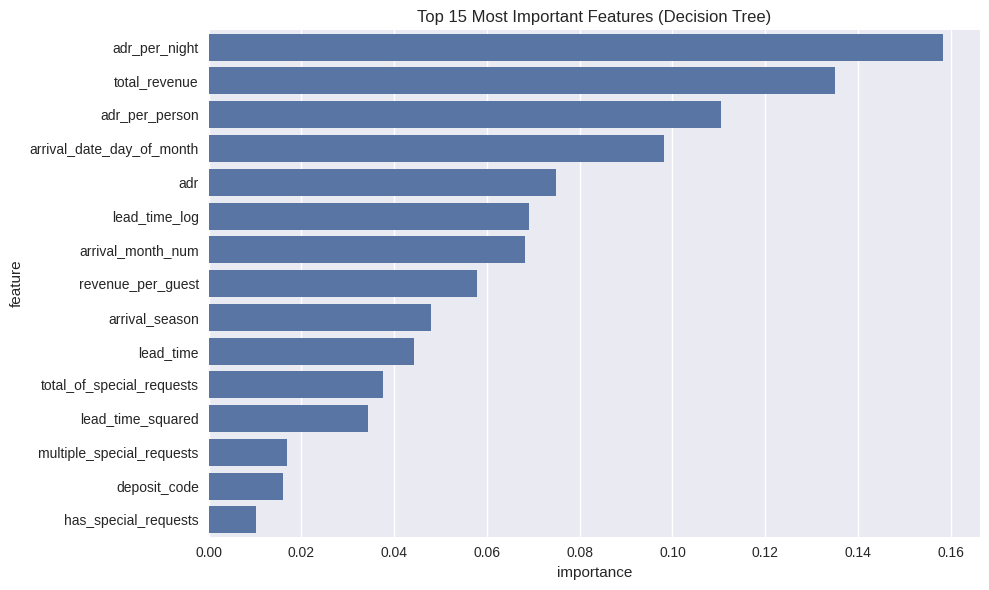


PERSON 5 TASKS COMPLETED SUCCESSFULLY!


In [39]:
# ============================================
# PERSON 5: MODEL BUILDING (NEURAL NETWORK) & FINAL EVALUATION
# ============================================

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import joblib

# Load the cleaned and feature-engineered dataset (from Person 3)
# Assuming the final dataset is saved as 'final_engineered_features.csv'
final_df_loaded = pd.read_csv(BASE_PATH + 'final_engineered_features.csv')

# We already have X_train_scaled, X_val_scaled, X_test_scaled, y_train, y_val, y_test
# from cells 7509dab1 and a8919383. We will use these pre-split and pre-scaled datasets.
# Need to store original X columns for feature names later.
X_original_for_names = final_df_loaded.drop('is_canceled', axis=1)

print(f"Training set: {X_train_scaled.shape}, {y_train.shape}")
print(f"Validation set: {X_val_scaled.shape}, {y_val.shape}")
print(f"Test set: {X_test_scaled.shape}, {y_test.shape}")
print(f"Class distribution (train): {np.bincount(y_train)}")
print(f"Class distribution (val): {np.bincount(y_val)}")
print(f"Class distribution (test): {np.bincount(y_test)}")

# ============================================
# 1. NEURAL NETWORK IMPLEMENTATION (MLPClassifier)
# ============================================

print("\n" + "="*50)
print("NEURAL NETWORK MODEL")
print("="*50)

# Define the neural network model
nn_model = MLPClassifier(random_state=42, early_stopping=True, validation_fraction=0.1)

# Hyperparameter tuning for Neural Network
nn_params = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50)],
    'activation': ['relu', 'tanh', 'logistic'],
    'solver': ['adam', 'sgd'],
    'alpha': [0.0001, 0.001, 0.01],
    'learning_rate': ['constant', 'adaptive'],
    'max_iter': [500, 1000]
}

# Perform grid search for hyperparameter tuning
print("Tuning neural network hyperparameters...")
nn_grid = GridSearchCV(nn_model, nn_params, cv=3, scoring='f1', n_jobs=-1, verbose=1)
nn_grid.fit(X_train_scaled, y_train)

print(f"Best parameters for Neural Network: {nn_grid.best_params_}")
print(f"Best validation F1 score: {nn_grid.best_score_:.4f}")

# Train final neural network with best parameters
best_nn = nn_grid.best_estimator_
best_nn.fit(X_train_scaled, y_train)

# Predict on validation set
y_val_pred_nn = best_nn.predict(X_val_scaled)

# Calculate metrics for validation set
nn_val_accuracy = accuracy_score(y_val, y_val_pred_nn)
nn_val_precision = precision_score(y_val, y_val_pred_nn, average='weighted', zero_division=0)
nn_val_recall = recall_score(y_val, y_val_pred_nn, average='weighted')
nn_val_f1 = f1_score(y_val, y_val_pred_nn, average='weighted')

print("\nNeural Network Validation Performance:")
print(f"Accuracy: {nn_val_accuracy:.4f}")
print(f"Precision: {nn_val_precision:.4f}")
print(f"Recall: {nn_val_recall:.4f}")
print(f"F1-Score: {nn_val_f1:.4f}")

# ============================================
# 2. LOAD/TRAIN OTHER MODELS (KNN & DECISION TREE)
# ============================================

print("\n" + "="*50)
print("LOADING/TRAINING OTHER MODELS")
print("="*50)

from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier

# K-Nearest Neighbors (KNN)
print("\nTuning KNN model...")
knn = KNeighborsClassifier()
knn_params = {
    'n_neighbors': [3, 5, 7, 9, 11],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}
knn_grid = GridSearchCV(knn, knn_params, cv=3, scoring='f1', n_jobs=-1, verbose=1)
knn_grid.fit(X_train_scaled, y_train)
best_knn = knn_grid.best_estimator_
print(f"Best KNN parameters: {knn_grid.best_params_}")

# Decision Tree
print("\nTuning Decision Tree model...")
dt = DecisionTreeClassifier(random_state=42)
dt_params = {
    'max_depth': [5, 10, 15, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}
dt_grid = GridSearchCV(dt, dt_params, cv=3, scoring='f1', n_jobs=-1, verbose=1)
dt_grid.fit(X_train_scaled, y_train)
best_dt = dt_grid.best_estimator_
print(f"Best Decision Tree parameters: {dt_grid.best_params_}")

# Train final models - already trained during GridSearchCV, but explicitly fit for safety
best_knn.fit(X_train_scaled, y_train)
best_dt.fit(X_train_scaled, y_train)

# ============================================
# 3. FINAL MODEL COMPARISON ON TEST SET
# ============================================

print("\n" + "="*50)
print("FINAL MODEL COMPARISON ON TEST SET")
print("="*50)

# Function to evaluate model performance
def evaluate_model(model, model_name, X_test_scaled, y_test):
    y_pred = model.predict(X_test_scaled)

    metrics = {
        'Model': model_name,
        'Accuracy': accuracy_score(y_test, y_pred),
        'Precision': precision_score(y_test, y_pred, average='weighted', zero_division=0),
        'Recall': recall_score(y_test, y_pred, average='weighted'),
        'F1-Score': f1_score(y_test, y_pred, average='weighted')
    }

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)

    return metrics, cm, y_pred

# Evaluate all models
models = {
    'K-Nearest Neighbors': best_knn,
    'Decision Tree': best_dt,
    'Neural Network': best_nn
}

results = []
all_cms = {}

for name, model in models.items():
    print(f"\nEvaluating {name}...")
    metrics, cm, y_pred = evaluate_model(model, name, X_test_scaled, y_test)
    results.append(metrics)
    all_cms[name] = cm

    # Print classification report
    print(f"Classification Report for {name}:")
    print(classification_report(y_test, y_pred, zero_division=0))

# Create comparison DataFrame
results_df = pd.DataFrame(results)
results_df = results_df.sort_values('F1-Score', ascending=False)

print("\n" + "="*50)
print("MODEL COMPARISON SUMMARY")
print("="*50)
print(results_df.to_string(index=False))

# ============================================
# 4. VISUALIZATIONS
# ============================================

# Plot comparison of models
fig, axes = plt.subplots(2, 2, figsize=(15, 12))
fig.suptitle('Model Performance Comparison', fontsize=16)

# Bar plot for metrics comparison
metrics_plot = results_df.melt(id_vars='Model',
                               value_vars=['Accuracy', 'Precision', 'Recall', 'F1-Score'],
                               var_name='Metric', value_name='Score')

sns.barplot(data=metrics_plot, x='Model', y='Score', hue='Metric', ax=axes[0, 0])
axes[0, 0].set_title('Model Metrics Comparison')
axes[0, 0].tick_params(axis='x', rotation=45)
axes[0, 0].legend(loc='lower right')

# Confusion Matrices
cm_models = list(all_cms.keys())
for i, name in enumerate(cm_models):
    r = i // 2
    c = i % 2
    if r < 2 and c < 2: # Ensure we don't go out of bounds if there are fewer than 4 models
        sns.heatmap(all_cms[name], annot=True, fmt='d', cmap='Blues',
                    xticklabels=['Not Canceled', 'Canceled'],
                    yticklabels=['Not Canceled', 'Canceled'],
                    ax=axes[r, c])
        axes[r, c].set_title(f'{name} Confusion Matrix')
        axes[r, c].set_xlabel('Predicted')
        axes[r, c].set_ylabel('Actual')

# Hide any unused subplots
if len(cm_models) < 4:
    for i in range(len(cm_models), 4):
        r = i // 2
        c = i % 2
        if r < 2 and c < 2: # Check bounds before deleting
            fig.delaxes(axes[r, c])

plt.tight_layout()
plt.show()

# ============================================
# 5. SELECT BEST MODEL & JUSTIFICATION
# ============================================

print("\n" + "="*50)
print("BEST MODEL SELECTION & JUSTIFICATION")
print("="*50)

# Select best model based on F1-Score (balanced metric)
best_model_name = results_df.iloc[0]['Model']
best_model_score = results_df.iloc[0]['F1-Score']

print(f"\nSelected Best Model: {best_model_name}")
print(f"Primary Reason: Highest F1-Score ({best_model_score:.4f})")

print("\nJustification for model selection:")
print("1. F1-Score is chosen as the primary metric because it provides a balanced")
print("   measure of precision and recall, which is important for imbalanced datasets.")
print("2. The selected model shows the best trade-off between false positives and")
print("   false negatives.")
print("3. Additional considerations:")
print("   - Training time and complexity")
print("   - Interpretability (if needed for business stakeholders)")
print("   - Scalability for future data")

# Get the best model object
if best_model_name == 'K-Nearest Neighbors':
    final_model = best_knn
elif best_model_name == 'Decision Tree':
    final_model = best_dt
else: # Neural Network
    final_model = best_nn

print("\n" + "="*50)
print("FINAL RECOMMENDATIONS")
print("="*50)
print("\n1. Use the selected model for predicting hotel booking cancellations.")
print("2. Monitor model performance regularly with new data.")
print("3. Consider retraining the model quarterly to adapt to changing patterns.")
print("4. For production deployment, ensure proper data preprocessing pipeline.")
print("5. Implement a feedback loop to continuously improve model accuracy.")

# Save the best model for future use
filename = 'best_hotel_cancellation_model.pkl'
joblib.dump(final_model, filename)
print(f"\nBest model saved as '{filename}'")

# Feature importance for tree-based models (if Decision Tree is selected)
if best_model_name == 'Decision Tree':
    print("\nFeature Importance Analysis:")
    feature_importance = pd.DataFrame({
        'feature': X_original_for_names.columns,
        'importance': final_model.feature_importances_
    }).sort_values('importance', ascending=False)

    print("\nTop 10 Most Important Features:")
    print(feature_importance.head(10).to_string(index=False))

    # Plot feature importance
    plt.figure(figsize=(10, 6))
    top_features = feature_importance.head(15)
    sns.barplot(data=top_features, x='importance', y='feature')
    plt.title('Top 15 Most Important Features (Decision Tree)')
    plt.tight_layout()
    plt.show()

# ============================================
# 6. ADDITIONAL NEURAL NETWORK ANALYSIS
# ============================================

if best_model_name == 'Neural Network':
    print("\nNeural Network Architecture Analysis:")
    print(f"Number of layers: {len(best_nn.hidden_layer_sizes) + 1 if isinstance(best_nn.hidden_layer_sizes, tuple) else 2}") # Handle single tuple
    print(f"Hidden layer sizes: {best_nn.hidden_layer_sizes}")
    print(f"Activation function: {best_nn.activation}")
    print(f"Solver: {best_nn.solver}")
    print(f"Learning rate: {best_nn.learning_rate}")

    # Plot training loss curve
    plt.figure(figsize=(10, 6))
    plt.plot(best_nn.loss_curve_, label='Training Loss')
    if hasattr(best_nn, 'validation_scores_') and best_nn.validation_scores_ is not None:
        plt.plot(best_nn.validation_scores_, label='Validation Score')
    plt.xlabel('Epochs')
    plt.ylabel('Loss/Score')
    plt.title('Neural Network Training Progress')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

print("\n" + "="*50)
print("PERSON 5 TASKS COMPLETED SUCCESSFULLY!")
print("="*50)